#### 1. Import dependecies 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import missingno as msno
from datetime import datetime
import re
from collections import Counter

from scipy.stats import chi2_contingency, ttest_ind, f_oneway
from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols

import warnings
warnings.filterwarnings('ignore')

In [2]:
absence=pd.read_csv("C:/Users/lando/OneDrive/Bureau/projects/turnover/turnover/data/clean_data/dimabsence.csv")
assignment=pd.read_csv("C:/Users/lando/OneDrive/Bureau/projects/turnover/turnover/data/clean_data/dimassignment.csv")
contract=pd.read_csv("C:/Users/lando/OneDrive/Bureau/projects/turnover/turnover/data/clean_data/dimcontract.csv")
employee=pd.read_csv("C:/Users/lando/OneDrive/Bureau/projects/turnover/turnover/data/clean_data/dimemployee.csv")
status=pd.read_csv("C:/Users/lando/OneDrive/Bureau/projects/turnover/turnover/data/clean_data/dimstatus.csv")
entryexit=pd.read_csv("C:/Users/lando/OneDrive/Bureau/projects/turnover/turnover/data/clean_data/dimentryexit.csv")

#### Explore the dataframes and drop unnecessary rows:

explore some important info about dataframes

In [3]:
dfs=['absence','assignment','contract','employee','status','entryexit']
for df_name in dfs:
    df = globals()[df_name]
    print(f"Number of duplicates in {df_name} is : \n {df.duplicated().sum()}")
    df=df.drop_duplicates()
    print(f"shape : \n {df.shape}")
    print(f"missing values are : \n {df.isna().sum()}")
    print("------------")

Number of duplicates in absence is : 
 5887
shape : 
 (8040, 7)
missing values are : 
 ABSENCE_KEY             0
EMP_CODE                0
ABSENCE_HOURS           0
MIN_ABSENCE_DAYS        0
ABSENCE_START_DATE    499
ABSENCE_END_DATE      499
ABSENCE_LIB             0
dtype: int64
------------
Number of duplicates in assignment is : 
 8
shape : 
 (19753, 5)
missing values are : 
 ASSIGNMENT_KEY               0
EMP_CODE                     0
ASSIGNMENT_START_DATE       23
ASSIGNMENT_END_DATE      16998
ASSIGNMENT_JOB_LIB           0
dtype: int64
------------
Number of duplicates in contract is : 
 359
shape : 
 (6107, 6)
missing values are : 
 CONTRACT_KEY              0
EMP_CODE                  0
CONTRACT_START_DATE       0
CONTRACT_END_DATE      2584
PAID_HOURS                0
QUALIFDESCRIPTION         0
dtype: int64
------------
Number of duplicates in employee is : 
 0
shape : 
 (23115, 10)
missing values are : 
 EMPLOYEE_KEY                  0
EMP_CODE                      0
EMP_

After discussing with my tutor I realized that columns indicating an ending date might be set to future date designing that the employee's contract hasn't ended yet for example in CONTRACT_END_DATE. Which explains the missing values of the columns that indicates the ending dates. So we can replace these columns with the current day. but we should pay attention (we are going to replace the missing dates in these 'end' columns only when the corresponding related 'start' and other columns are not missing!)

In [4]:
absence = absence.drop_duplicates()
contract = contract.drop_duplicates()
assignment = assignment.drop_duplicates()
absence=absence.dropna()
status.dropna(subset=['STATUS_START_DATE','TURNOVER'],inplace=True)
assignment.dropna(subset=['ASSIGNMENT_START_DATE'], inplace=True)
entryexit=entryexit.dropna()

#### 2. Feature engineering and data merging :

In [5]:
employee['EMP_CODE'].nunique()

21591

In [6]:
employee.drop_duplicates(subset=['EMP_CODE', 'EMP_FIRSTNAME', 'EMP_LASTNAME'], inplace=True)
employee.shape

(21591, 10)

We have 21 591 employees within the company

In [7]:
status['EMP_CODE'].nunique()

20973

In [8]:
grouped_df = status.groupby('EMP_CODE')
for emp_code, group_data in grouped_df:
    print(f"Group for EMP_CODE {emp_code}:")
    
    # Get distinct values in 'STATUS_START_DATE' column
    distinct_status_start_dates = group_data['STATUS_START_DATE'].unique()
    print(f"Distinct STATUS_START_DATE values: {distinct_status_start_dates}")
    
    # Get distinct values in 'STATUS_START_DATE' column
    distinct_status_end_dates = group_data['STATUS_END_DATE'].unique()
    print(f"Distinct STATUS_END_DATE values: {distinct_status_end_dates}")
    
    # Get distinct values in 'TURNOVER' column
    distinct_turnovers = group_data['TURNOVER'].unique()
    print(f"Distinct TURNOVER values: {distinct_turnovers}")

Group for EMP_CODE 1:
Distinct STATUS_START_DATE values: ['2014-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 2:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 3:
Distinct STATUS_START_DATE values: ['2014-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 21:
Distinct STATUS_START_DATE values: ['2022-05-16']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 22:
Distinct STATUS_START_DATE values: ['2017-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 41:
Distinct STATUS_START_DATE values: ['2013-11-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 42:
Distinct STATUS_START_DATE values: ['2014-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Gr

Distinct TURNOVER values: [0.]
Group for EMP_CODE 874:
Distinct STATUS_START_DATE values: ['2014-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 875:
Distinct STATUS_START_DATE values: ['2014-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 876:
Distinct STATUS_START_DATE values: ['2014-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 877:
Distinct STATUS_START_DATE values: ['2014-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 878:
Distinct STATUS_START_DATE values: ['2014-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 879:
Distinct STATUS_START_DATE values: ['2014-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 880:
Distinct STATUS_START_DATE values: ['2014-01-01']
Distinct STATUS_END_DATE values

Distinct STATUS_START_DATE values: ['2015-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 6413:
Distinct STATUS_START_DATE values: ['2015-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 6414:
Distinct STATUS_START_DATE values: ['2015-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 6415:
Distinct STATUS_START_DATE values: ['2015-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 6416:
Distinct STATUS_START_DATE values: ['2015-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 6417:
Distinct STATUS_START_DATE values: ['2015-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 6418:
Distinct STATUS_START_DATE values: ['2015-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for 

Distinct STATUS_START_DATE values: ['2015-02-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 16001:
Distinct STATUS_START_DATE values: ['2016-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 16002:
Distinct STATUS_START_DATE values: ['2013-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 16021:
Distinct STATUS_START_DATE values: ['2013-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 16041:
Distinct STATUS_START_DATE values: ['2013-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 16061:
Distinct STATUS_START_DATE values: ['2013-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 16081:
Distinct STATUS_START_DATE values: ['2015-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Grou

Distinct STATUS_START_DATE values: ['2016-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 25421:
Distinct STATUS_START_DATE values: ['2016-05-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 25441:
Distinct STATUS_START_DATE values: ['2016-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 25442:
Distinct STATUS_START_DATE values: ['2016-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 25461:
Distinct STATUS_START_DATE values: ['2016-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 25481:
Distinct STATUS_START_DATE values: ['2016-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 25501:
Distinct STATUS_START_DATE values: ['2016-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Grou

Distinct STATUS_START_DATE values: ['2017-04-01' '2017-03-15' '2017-04-15']
Distinct STATUS_END_DATE values: ['2017-04-15' '2017-04-01' nan]
Distinct TURNOVER values: [1. 0.]
Group for EMP_CODE 33142:
Distinct STATUS_START_DATE values: ['2017-04-01' '2017-03-15']
Distinct STATUS_END_DATE values: [nan '2017-04-01']
Distinct TURNOVER values: [0. 1.]
Group for EMP_CODE 33143:
Distinct STATUS_START_DATE values: ['2015-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 33161:
Distinct STATUS_START_DATE values: ['2015-07-01' '2015-04-01']
Distinct STATUS_END_DATE values: [nan '2015-07-01']
Distinct TURNOVER values: [0. 1.]
Group for EMP_CODE 33181:
Distinct STATUS_START_DATE values: ['2017-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 33201:
Distinct STATUS_START_DATE values: ['2015-04-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 33221:
Distinct ST

Distinct STATUS_START_DATE values: ['2014-08-01' '2014-09-01' '2014-09-26' '2014-12-22' '2014-12-28'
 '2015-01-03' '2015-01-28' '2015-02-27' '2015-03-01' '2015-09-02'
 '2014-08-23' '2015-04-06' '2015-04-03' '2015-04-05' '2015-05-07'
 '2015-06-26' '2015-06-28' '2015-07-01' '2015-12-02' '2016-09-03'
 '2016-10-01' '2017-08-14' '2015-08-02']
Distinct STATUS_END_DATE values: ['2014-08-23' '2014-09-26' '2014-12-22' '2014-12-28' '2015-01-03'
 '2015-01-28' '2015-02-27' '2015-03-01' '2015-04-03' '2015-12-02'
 '2014-09-01' '2015-05-07' '2015-04-05' '2015-04-06' '2015-06-26'
 '2015-06-28' '2015-07-01' '2015-08-02' '2016-09-03' '2016-10-01'
 '2017-08-14' nan '2015-09-02']
Distinct TURNOVER values: [1. 0.]
Group for EMP_CODE 41681:
Distinct STATUS_START_DATE values: ['2017-01-15']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 41701:
Distinct STATUS_START_DATE values: ['2017-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group

Distinct STATUS_START_DATE values: ['2017-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 53921:
Distinct STATUS_START_DATE values: ['2017-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 53941:
Distinct STATUS_START_DATE values: ['2017-01-01' '2017-04-01']
Distinct STATUS_END_DATE values: ['2017-04-01' nan]
Distinct TURNOVER values: [1. 0.]
Group for EMP_CODE 53961:
Distinct STATUS_START_DATE values: ['2017-12-26' '2018-05-02']
Distinct STATUS_END_DATE values: ['2018-05-02' nan]
Distinct TURNOVER values: [1. 0.]
Group for EMP_CODE 53981:
Distinct STATUS_START_DATE values: ['2018-01-01' '2018-05-03' '2018-04-04']
Distinct STATUS_END_DATE values: ['2018-04-04' nan '2018-05-03']
Distinct TURNOVER values: [1. 0.]
Group for EMP_CODE 54001:
Distinct STATUS_START_DATE values: ['2017-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 54021:
Distinct ST

Distinct STATUS_START_DATE values: ['2016-07-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 64878:
Distinct STATUS_START_DATE values: ['2016-07-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 64879:
Distinct STATUS_START_DATE values: ['2016-07-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 64880:
Distinct STATUS_START_DATE values: ['2016-07-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 64881:
Distinct STATUS_START_DATE values: ['2016-07-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 64882:
Distinct STATUS_START_DATE values: ['2015-07-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 64883:
Distinct STATUS_START_DATE values: ['2015-07-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Grou

Distinct STATUS_START_DATE values: ['2018-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 72602:
Distinct STATUS_START_DATE values: ['2018-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 72603:
Distinct STATUS_START_DATE values: ['2018-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 72605:
Distinct STATUS_START_DATE values: ['2018-03-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 72661:
Distinct STATUS_START_DATE values: ['2018-05-01' '2018-01-01']
Distinct STATUS_END_DATE values: [nan '2018-05-01']
Distinct TURNOVER values: [0. 1.]
Group for EMP_CODE 72701:
Distinct STATUS_START_DATE values: ['2018-01-01' '2018-05-01']
Distinct STATUS_END_DATE values: ['2018-05-01' nan]
Distinct TURNOVER values: [1. 0.]
Group for EMP_CODE 72721:
Distinct STATUS_START_DATE values: ['2018-01-01' '2018-05-01']
Dis

Distinct STATUS_START_DATE values: ['2014-01-01' '2016-01-02' '2016-02-01' '2017-01-02' '2018-03-01'
 '2023-03-02']
Distinct STATUS_END_DATE values: ['2016-01-02' '2016-02-01' '2017-01-02' '2018-03-01' '2023-03-02' nan]
Distinct TURNOVER values: [1. 0.]
Group for EMP_CODE 82161:
Distinct STATUS_START_DATE values: ['2021-01-01' '2018-01-01' '2019-08-16' '2020-01-01']
Distinct STATUS_END_DATE values: [nan '2019-08-16' '2020-01-01' '2021-01-01']
Distinct TURNOVER values: [0. 1.]
Group for EMP_CODE 82181:
Distinct STATUS_START_DATE values: ['2019-03-05' '2018-03-05']
Distinct STATUS_END_DATE values: [nan '2019-03-05']
Distinct TURNOVER values: [0. 1.]
Group for EMP_CODE 82201:
Distinct STATUS_START_DATE values: ['2015-01-01' '2017-01-02']
Distinct STATUS_END_DATE values: ['2017-01-02' nan]
Distinct TURNOVER values: [1. 0.]
Group for EMP_CODE 82221:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 8224

Distinct STATUS_START_DATE values: ['2017-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 94463:
Distinct STATUS_START_DATE values: ['2017-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 94464:
Distinct STATUS_START_DATE values: ['2016-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 94465:
Distinct STATUS_START_DATE values: ['2019-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 94466:
Distinct STATUS_START_DATE values: ['2017-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 94467:
Distinct STATUS_START_DATE values: ['2020-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 94481:
Distinct STATUS_START_DATE values: ['2018-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Grou

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 97437:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 97438:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 97439:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 97440:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 97441:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 97442:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Grou

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 98313:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 98314:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 98315:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 98316:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 98317:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 98318:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Grou

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 99444:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 99445:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 99446:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 99447:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 99448:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 99449:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Grou

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 102877:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 102878:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 102879:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 102880:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 102881:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 102882:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 103529:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 103530:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 103531:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 103532:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 103533:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 103534:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 104201:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 104202:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 104203:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 104204:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 104205:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 104206:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 105706:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 105707:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 105708:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 105709:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 105710:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 105711:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 106866:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 106867:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 106868:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 106869:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 106870:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 106871:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 107698:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 107699:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 107700:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 107701:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 107721:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 107722:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 108524:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 108525:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 108526:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 108527:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 108528:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 108529:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 109834:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 109835:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 109836:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 109837:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 109838:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 109839:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 110786:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 110787:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 110788:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 110789:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 110790:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 110791:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.

Distinct TURNOVER values: [0.]
Group for EMP_CODE 111511:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 111512:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 111513:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 111514:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 111515:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 111516:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 111517:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct S

Distinct STATUS_START_DATE values: ['2020-01-01' '2020-04-02' '2020-04-15' '2020-06-02' '2020-06-15'
 '2020-06-21' '2020-06-25']
Distinct STATUS_END_DATE values: ['2020-04-02' '2020-04-15' '2020-06-02' '2020-06-15' '2020-06-21'
 '2020-06-25' nan]
Distinct TURNOVER values: [1. 0.]
Group for EMP_CODE 114762:
Distinct STATUS_START_DATE values: ['2020-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 114782:
Distinct STATUS_START_DATE values: ['2020-06-20']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 114802:
Distinct STATUS_START_DATE values: ['2020-06-03']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 114822:
Distinct STATUS_START_DATE values: ['2020-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 114842:
Distinct STATUS_START_DATE values: ['2020-05-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOV

Distinct STATUS_START_DATE values: ['2021-02-01' '2019-01-01' '2020-06-01' '2020-06-02' '2020-07-13'
 '2020-11-02']
Distinct STATUS_END_DATE values: [nan '2020-06-01' '2020-06-02' '2020-07-13' '2020-11-02' '2021-02-01']
Distinct TURNOVER values: [0. 1.]
Group for EMP_CODE 125402:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 125422:
Distinct STATUS_START_DATE values: ['2020-08-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 125423:
Distinct STATUS_START_DATE values: ['2021-01-11']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 125442:
Distinct STATUS_START_DATE values: ['2021-01-11']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 125462:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for E

Distinct STATUS_START_DATE values: ['2016-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 135843:
Distinct STATUS_START_DATE values: ['2020-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 135844:
Distinct STATUS_START_DATE values: ['2020-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 135845:
Distinct STATUS_START_DATE values: ['2020-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 135846:
Distinct STATUS_START_DATE values: ['2020-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 135847:
Distinct STATUS_START_DATE values: ['2020-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 135848:
Distinct STATUS_START_DATE values: ['2020-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.

Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 149811:
Distinct STATUS_START_DATE values: ['2022-12-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 149831:
Distinct STATUS_START_DATE values: ['2022-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 149851:
Distinct STATUS_START_DATE values: ['2018-10-15']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 149871:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 149891:
Distinct STATUS_START_DATE values: ['2022-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 149911:
Distinct STATUS_START_DATE values: ['2022-05-01' '2022-07-01' '2021-12-01' '2022-02-01' '2022-03-01']
Distinct STATUS_

Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 155194:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 155195:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 155196:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 155197:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 155198:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 155199:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.

Distinct STATUS_START_DATE values: ['2006-04-10' '2006-04-29' '2021-01-05' '2021-12-26' '2022-01-04'
 '2021-12-22' '2023-07-02']
Distinct STATUS_END_DATE values: ['2006-04-29' '2021-01-05' '2021-12-22' '2022-01-04' '2023-07-02'
 '2021-12-26' nan]
Distinct TURNOVER values: [1. 0.]
Group for EMP_CODE 166731:
Distinct STATUS_START_DATE values: ['2023-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 166751:
Distinct STATUS_START_DATE values: ['2023-01-01' '2023-07-12']
Distinct STATUS_END_DATE values: ['2023-07-12' nan]
Distinct TURNOVER values: [1. 0.]
Group for EMP_CODE 166771:
Distinct STATUS_START_DATE values: ['2022-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 166791:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct TURNOVER values: [0.]
Group for EMP_CODE 166811:
Distinct STATUS_START_DATE values: ['2023-01-01']
Distinct STATUS_END_DATE 

There are employees who rechange their status, hence we can add a variable "SENIORITY_DATE" and "CURRENT_STATUS_DATE" and correct the TURNOVER column

In [9]:
def transform_columns_dtype(df, column_names, new_dtype):
    """
    Transform multiple columns' data type in a pandas DataFrame to the same type.
    
    Parameters:
    - df: pandas DataFrame
    - column_names: List of column names to be transformed
    - new_dtype: The target data type ('datetime', 'category')
    
    Returns:
    - Transformed DataFrame with the specified columns' data type changed.
    """
    if new_dtype == 'datetime':
        for col in column_names:
            df[col] = pd.to_datetime(df[col], errors='coerce')  
    elif new_dtype == 'string':
        for col in column_names:
            df[col] = df[col].astype('string')
    elif new_dtype == 'category':
        for col in column_names:
            df[col] = df[col].astype('category')
    else:
        raise ValueError("Invalid data type. Supported types: 'datetime', 'category'")
    
    return df

In [10]:
status=transform_columns_dtype(status,['STATUS_START_DATE','STATUS_END_DATE'],'datetime')

In [11]:
def custom_turnover_agg(series):
    return 1 if (series == 1).any() else 0

# Group by 'EMP_CODE' and aggregate using the custom function
status = status.groupby('EMP_CODE').agg(
    SENIORITY_DATE=('STATUS_START_DATE', 'min'),
    CURRENT_STATUS_DATE=('STATUS_END_DATE', 'max'),
    TURNOVER=('TURNOVER', custom_turnover_agg)
).reset_index()

In [12]:
status['TURNOVER'].value_counts()

TURNOVER
0    18689
1     2284
Name: count, dtype: int64

In [13]:
assignment['EMP_CODE'].nunique()

17660

In [14]:
grouped_df = assignment.groupby('EMP_CODE')
for emp_code, group_data in grouped_df:
    print(f"Group for EMP_CODE {emp_code}:")
    
    # Get distinct values in 'STATUS_START_DATE' column
    distinct_assignment_start_dates = group_data['ASSIGNMENT_START_DATE'].unique()
    print(f"Distinct STATUS_START_DATE values: {distinct_assignment_start_dates}")
    
    # Get distinct values in 'STATUS_START_DATE' column
    distinct_assignment_end_dates = group_data['ASSIGNMENT_END_DATE'].unique()
    print(f"Distinct STATUS_END_DATE values: {distinct_assignment_end_dates}")
    
    # Get distinct values in 'TURNOVER' column
    distinct_jobs = group_data['ASSIGNMENT_JOB_LIB'].unique()
    print(f"Distinct ASSIGNMENT_JOB_LIB values: {distinct_jobs}")

Group for EMP_CODE 1:
Distinct STATUS_START_DATE values: ['2014-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 2:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ingénieur']
Group for EMP_CODE 3:
Distinct STATUS_START_DATE values: ['2014-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 21:
Distinct STATUS_START_DATE values: ['2022-05-16']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 22:
Distinct STATUS_START_DATE values: ['2017-01-01' '2022-04-01']
Distinct STATUS_END_DATE values: ['2022-03-31' nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 41:
Distinct STATUS_START_DATE values: ['2013-11-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group 

Distinct STATUS_START_DATE values: ['2014-01-01' '2014-02-01']
Distinct STATUS_END_DATE values: ['2014-01-31' nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 4841:
Distinct STATUS_START_DATE values: ['2013-01-01']
Distinct STATUS_END_DATE values: ['2015-07-30']
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 4861:
Distinct STATUS_START_DATE values: ['2015-01-01']
Distinct STATUS_END_DATE values: ['2015-07-31']
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 4881:
Distinct STATUS_START_DATE values: ['2015-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 4901:
Distinct STATUS_START_DATE values: ['2013-01-01']
Distinct STATUS_END_DATE values: ['2015-07-30']
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 4921:
Distinct STATUS_START_DATE values: ['2015-10-03' '2015-10-15' '2018-01-05']
Distinct STATUS_END_DATE values: ['2015-10-10' '2018-0

Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 22561:
Distinct STATUS_START_DATE values: ['2016-07-15']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 22601:
Distinct STATUS_START_DATE values: ['2016-01-01']
Distinct STATUS_END_DATE values: ['2016-05-01']
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 22621:
Distinct STATUS_START_DATE values: ['2016-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 22641:
Distinct STATUS_START_DATE values: ['2015-01-01']
Distinct STATUS_END_DATE values: ['2015-01-01']
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 22701:
Distinct STATUS_START_DATE values: ['2015-01-01']
Distinct STATUS_END_DATE values: ['2015-01-01']
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 22721:
Distinct STATUS_START_DATE values: ['2015-01-01']
Distinct STATUS_END_DATE

Distinct STATUS_START_DATE values: ['2015-01-01']
Distinct STATUS_END_DATE values: ['2016-05-31']
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 34801:
Distinct STATUS_START_DATE values: ['2017-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 34821:
Distinct STATUS_START_DATE values: ['2015-01-01' '2017-01-01']
Distinct STATUS_END_DATE values: ['2016-12-31' '2017-01-08']
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 34841:
Distinct STATUS_START_DATE values: ['2016-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 34861:
Distinct STATUS_START_DATE values: ['2015-01-01' '2015-02-01']
Distinct STATUS_END_DATE values: ['2015-01-31' nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs' 'Autres']
Group for EMP_CODE 34881:
Distinct STATUS_START_DATE values: ['2017-01-01']
Distinct STATUS_END_DATE values: [nan]
Distin

Distinct STATUS_START_DATE values: ['2018-01-01' '2015-10-01']
Distinct STATUS_END_DATE values: [nan '2017-12-30']
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 50899:
Distinct STATUS_START_DATE values: ['2014-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 50900:
Distinct STATUS_START_DATE values: ['2014-10-01' '2018-03-15']
Distinct STATUS_END_DATE values: ['2018-03-14' nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 50901:
Distinct STATUS_START_DATE values: ['2018-02-01' '2017-04-01']
Distinct STATUS_END_DATE values: [nan '2018-01-30']
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 50902:
Distinct STATUS_START_DATE values: ['2014-10-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 50903:
Distinct STATUS_START_DATE values: ['2015-10-01']
Distinct STATUS_END_DATE values: [nan]
Dis

Distinct STATUS_START_DATE values: ['2018-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 68481:
Distinct STATUS_START_DATE values: ['2018-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Autres']
Group for EMP_CODE 68501:
Distinct STATUS_START_DATE values: ['2019-01-01' '2018-01-01']
Distinct STATUS_END_DATE values: [nan '2018-12-31']
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 68521:
Distinct STATUS_START_DATE values: ['2018-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 68522:
Distinct STATUS_START_DATE values: ['2019-01-01' '2018-01-01']
Distinct STATUS_END_DATE values: [nan '2018-12-31']
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 68561:
Distinct STATUS_START_DATE values: ['2018-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Res

Distinct STATUS_START_DATE values: ['2017-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Secrétariat général']
Group for EMP_CODE 78325:
Distinct STATUS_START_DATE values: ['2017-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Secrétariat général']
Group for EMP_CODE 78326:
Distinct STATUS_START_DATE values: ['2017-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Production']
Group for EMP_CODE 78341:
Distinct STATUS_START_DATE values: ['2019-02-01' '2019-01-01']
Distinct STATUS_END_DATE values: [nan '2019-01-31']
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 78361:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 78381:
Distinct STATUS_START_DATE values: ['2019-01-01' '2019-02-01']
Distinct STATUS_END_DATE values: ['2019-01-31' nan]
Distinct ASSI

Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 96739:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 96740:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 96741:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 96742:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 96743:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 96744:
Distinct STATUS_START_DATE values: ['20

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 97893:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 97894:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 97895:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 97896:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 97897:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: 

Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 98556:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 98557:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 98558:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 98559:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 98560:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 98561:
Distinct STATUS_START_DATE values: ['20

Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 99520:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 99521:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 99522:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 99523:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 99524:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 99525:
Distinct STATUS_START_DATE values: ['20

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 103192:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 103193:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 103194:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 103195:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 103196:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB val

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 104072:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 104073:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 104074:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 104075:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 104076:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB val

Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 105948:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 105949:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 105950:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 105951:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 105952:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 105953:
Distinct STATUS_START_DATE values

Group for EMP_CODE 107372:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 107373:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 107374:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 107375:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 107376:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 107377:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Dist

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 108398:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 108399:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 108400:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 108401:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 108402:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB val

Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 109875:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 109876:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 109881:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 109882:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 109883:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB val

Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 111227:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 111228:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 111229:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 111230:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 111231:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 111232:
Distinct STATUS_START_DATE values

Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 111909:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 111910:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 111911:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 111912:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 111913:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Ressources Humaines']
Group for EMP_CODE 111914:
Distinct STATUS_START_DATE values

Group for EMP_CODE 131902:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 131903:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 131922:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 131942:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Autres']
Group for EMP_CODE 131962:
Distinct STATUS_START_DATE values: ['2021-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Autres']
Group for EMP_CODE 131982:
Distinct STATUS_START_DATE values: ['2021-09-27']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group 

Group for EMP_CODE 151831:
Distinct STATUS_START_DATE values: ['2022-11-11']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Analyste']
Group for EMP_CODE 151851:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 151852:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 151853:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 151854:
Distinct STATUS_START_DATE values: ['2019-01-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Directeurs']
Group for EMP_CODE 151871:
Distinct STATUS_START_DATE values: ['2021-07-01']
Distinct STATUS_END_DATE values: [nan]
Distinct ASSIGNMENT_JOB_LIB values: ['Secrétariat g

In [15]:
assignment=transform_columns_dtype(assignment,['ASSIGNMENT_START_DATE','ASSIGNMENT_END_DATE'],'datetime')
assignment=transform_columns_dtype(assignment,['ASSIGNMENT_JOB_LIB'],'category')

In [16]:
assignment_df = assignment.sort_values(by='ASSIGNMENT_START_DATE')

# Group the sorted assignment DataFrame by 'EMP_CODE' and aggregate the data
aggregated_assignment_df = assignment_df.groupby('EMP_CODE').agg(
    ASSIGNMENTS=('ASSIGNMENT_START_DATE', 'nunique'),  # Count distinct STATUS_START_DATE values
    ASSIGNMENT_JOB_LIB=('ASSIGNMENT_JOB_LIB', 'last'),  # Last job lib when sorted by STATUS_START_DATE
    JOBS_ASSIGN=('ASSIGNMENT_JOB_LIB', 'count'),  # Count occurrences of ASSIGNMENT_JOB_LIB
).reset_index()

# Determine 'PROMOTION' based on the value of 'JOBS_ASSIGN'
aggregated_assignment_df['PROMOTION'] = aggregated_assignment_df['JOBS_ASSIGN'].apply(lambda x: 'Yes' if x > 1 else 'No')

# Drop the intermediate column 'JOBS_ASSIGN'
aggregated_assignment_df.drop(columns=['JOBS_ASSIGN'], inplace=True)

# Print the resulting DataFrame with 'EMP_CODE' as a column
print(aggregated_assignment_df)

       EMP_CODE  ASSIGNMENTS ASSIGNMENT_JOB_LIB PROMOTION
0             1            1           Analyste        No
1             2            1          Ingénieur        No
2             3            1           Analyste        No
3            21            1         Directeurs        No
4            22            2         Directeurs       Yes
...         ...          ...                ...       ...
17655    168031            3         Directeurs       Yes
17656    168071            1         Directeurs        No
17657    168072            1             Autres        No
17658    168073            1             Autres        No
17659    168074            1             Autres        No

[17660 rows x 4 columns]


In [17]:
aggregated_assignment_df['PROMOTION'].value_counts()

PROMOTION
No     16261
Yes     1399
Name: count, dtype: int64

In [18]:
assignment=aggregated_assignment_df

In [19]:
absence['EMP_CODE'].nunique()

1401

In [20]:
grouped_df = absence.groupby('EMP_CODE')
for emp_code, group_data in grouped_df:
    print(f"Group for EMP_CODE {emp_code}:")
    
    # Get distinct values in 'STATUS_START_DATE' column
    distinct_absence_hours = group_data['ABSENCE_HOURS'].unique()
    print(f"Distinct ABSENCE_HOURS values: {distinct_absence_hours}")
    
    # Get distinct values in 'STATUS_START_DATE' column
    distinct_min_absence_days = group_data['MIN_ABSENCE_DAYS'].unique()
    print(f"Distinct MIN_ABSENCE_DAYS values: {distinct_min_absence_days}")
    
    # Get distinct values in 'TURNOVER' column
    distinct_absence = group_data['ABSENCE_START_DATE'].unique()
    print(f"Distinct ABSENCE_START_DATE values: {distinct_absence}")
    
    # Get distinct values in 'TURNOVER' column
    distinct_absence_end = group_data['ABSENCE_END_DATE'].unique()
    print(f"Distinct ABSENCE_END_DATE values: {distinct_absence_end}")

Group for EMP_CODE 22:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [6.]
Distinct ABSENCE_START_DATE values: ['2022-04-15']
Distinct ABSENCE_END_DATE values: ['2022-04-20']
Group for EMP_CODE 161:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [ 1. 11.  5.  2.  8.  3.]
Distinct ABSENCE_START_DATE values: ['2021-09-18' '2021-06-18' '2021-09-20' '2021-02-19' '2021-10-01'
 '2021-07-01' '2021-02-01' '2021-03-12' '2021-06-21' '2021-06-28']
Distinct ABSENCE_END_DATE values: ['2021-09-18' '2021-06-18' '2021-09-30' '2021-02-19' '2021-10-05'
 '2021-07-02' '2021-02-01' '2021-03-19' '2021-06-25' '2021-06-30']
Group for EMP_CODE 202:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [1.]
Distinct ABSENCE_START_DATE values: ['2022-10-04']
Distinct ABSENCE_END_DATE values: ['2022-10-04']
Group for EMP_CODE 204:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [18.  2.]
Distinct ABSENCE_START_DATE values: ['2022-

Distinct ABSENCE_START_DATE values: ['2012-09-03' '2014-02-01' '2014-10-01' '2015-09-01' '2015-11-23'
 '2016-05-01' '2012-08-31' '2013-12-01' '2014-05-01' '2015-05-01'
 '2015-06-01' '2015-10-01' '2016-02-01' '2012-10-01' '2013-03-01'
 '2013-09-01' '2013-10-01' '2013-11-01' '2014-08-01' '2015-02-01'
 '2015-03-01' '2015-07-01' '2016-07-01' '2012-09-01' '2013-07-01'
 '2014-01-01' '2014-11-01' '2015-11-01' '2016-06-01' '2016-08-01'
 '2013-06-01' '2014-09-01' '2015-01-01' '2015-04-01' '2016-01-01'
 '2014-06-01' '2012-11-01' '2013-02-27' '2014-03-01' '2013-01-01'
 '2013-02-01' '2013-04-01' '2014-07-01' '2014-12-01' '2016-04-01'
 '2012-12-01' '2013-05-01' '2013-08-01' '2014-04-01' '2015-08-01'
 '2015-12-01' '2016-03-01']
Distinct ABSENCE_END_DATE values: ['2012-09-30' '2014-02-28' '2014-10-31' '2015-09-30' '2015-11-30'
 '2016-05-31' '2012-08-31' '2013-12-31' '2014-05-31' '2015-05-31'
 '2015-06-30' '2015-10-31' '2016-02-29' '2012-10-31' '2013-03-31'
 '2013-09-30' '2013-10-31' '2013-11-30' '201

Distinct ABSENCE_START_DATE values: ['2016-06-04' '2016-02-01' '2016-06-01' '2016-02-09' '2016-04-01'
 '2016-03-01' '2016-04-04' '2016-02-04']
Distinct ABSENCE_END_DATE values: ['2016-06-30' '2016-02-28' '2016-02-03' '2016-04-30' '2016-04-03'
 '2016-06-03' '2016-03-10']
Group for EMP_CODE 35241:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [7.]
Distinct ABSENCE_START_DATE values: ['2017-01-01']
Distinct ABSENCE_END_DATE values: ['2017-01-10']
Group for EMP_CODE 35281:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [10.  1. 15.]
Distinct ABSENCE_START_DATE values: ['2018-01-01' '2018-02-28' '2018-03-01']
Distinct ABSENCE_END_DATE values: ['2018-01-10' '2018-02-28' '2018-03-15']
Group for EMP_CODE 35301:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [ 9. 12.  1. 17. 28. 31.  6.  3.  5. 22.  4.  7.  2. 19. 23.]
Distinct ABSENCE_START_DATE values: ['2015-12-03' '2016-04-18' '2016-12-02' '2017-02-09' '2017-02-01'
 '2017

Distinct ABSENCE_START_DATE values: ['2019-01-23' '2019-02-09' '2019-01-19' '2019-02-15' '2019-01-25'
 '2019-02-13' '2019-03-01' '2019-03-03']
Distinct ABSENCE_END_DATE values: ['2019-01-28' '2019-02-12' '2019-01-22' '2019-02-28' '2019-01-24'
 '2019-03-06']
Group for EMP_CODE 69981:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [5. 3. 1. 2.]
Distinct ABSENCE_START_DATE values: ['2018-07-08' '2018-07-23' '2018-05-23' '2018-05-04' '2018-07-20'
 '2018-07-11' '2018-07-13' '2018-05-13' '2018-05-22']
Distinct ABSENCE_END_DATE values: ['2018-07-13' '2018-07-10' '2018-07-23' '2018-05-24' '2018-05-08'
 '2018-07-12' '2018-07-22' '2018-05-14' '2018-05-22']
Group for EMP_CODE 69982:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [1. 9. 5.]
Distinct ABSENCE_START_DATE values: ['2018-05-04' '2018-06-06' '2018-05-12']
Distinct ABSENCE_END_DATE values: ['2018-05-06' '2018-06-14' '2018-05-16']
Group for EMP_CODE 69983:
Distinct ABSENCE_HOURS values: [0.]
D

Distinct ABSENCE_END_DATE values: ['2019-01-21' '2019-01-31' '2018-11-30' '2019-02-05' '2018-12-08'
 '2019-02-02']
Group for EMP_CODE 74443:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [15.  2.]
Distinct ABSENCE_START_DATE values: ['2018-11-14' '2018-11-04']
Distinct ABSENCE_END_DATE values: ['2018-11-28' '2018-11-05']
Group for EMP_CODE 74444:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [15.  4.  5.]
Distinct ABSENCE_START_DATE values: ['2018-11-04' '2018-12-01' '2018-11-26']
Distinct ABSENCE_END_DATE values: ['2018-11-18' '2018-12-04' '2018-11-30']
Group for EMP_CODE 74445:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [3. 1. 2. 5. 4. 7.]
Distinct ABSENCE_START_DATE values: ['2019-02-01' '2019-02-03' '2019-01-19' '2018-11-26' '2019-01-21'
 '2019-01-31' '2018-11-04' '2019-01-23' '2018-11-12' '2018-12-01']
Distinct ABSENCE_END_DATE values: ['2019-02-03' '2019-01-22' '2019-02-02' '2018-11-30' '2019-01-24'
 '2019

Distinct ABSENCE_END_DATE values: ['2021-03-01' '2021-03-31' '2021-05-31' '2021-07-31' '2021-04-29'
 '2021-06-01' '2021-06-03' '2021-06-30' '2021-08-31' '2021-08-29'
 '2021-04-30' '2021-05-29' '2021-03-03' '2021-07-30']
Group for EMP_CODE 131762:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [ 2.  3.  1. 16.]
Distinct ABSENCE_START_DATE values: ['2021-01-02' '2021-01-04' '2021-01-08' '2021-01-01' '2021-01-11']
Distinct ABSENCE_END_DATE values: ['2021-01-03' '2021-01-06' '2021-01-10' '2021-01-01' '2021-01-26']
Group for EMP_CODE 132002:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [31.]
Distinct ABSENCE_START_DATE values: ['2021-03-01']
Distinct ABSENCE_END_DATE values: ['2021-03-31']
Group for EMP_CODE 132042:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [17.]
Distinct ABSENCE_START_DATE values: ['2020-04-04']
Distinct ABSENCE_END_DATE values: ['2020-04-20']
Group for EMP_CODE 132082:
Distinct ABSENCE_HOURS value

Distinct MIN_ABSENCE_DAYS values: [3.]
Distinct ABSENCE_START_DATE values: ['2021-07-07']
Distinct ABSENCE_END_DATE values: ['2021-07-09']
Group for EMP_CODE 153221:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [22. 18. 19.  2. 16.]
Distinct ABSENCE_START_DATE values: ['2021-10-03' '2022-07-05' '2021-07-05' '2022-08-01' '2022-09-01'
 '2022-10-01' '2021-09-01' '2021-10-01' '2022-10-03' '2021-08-01']
Distinct ABSENCE_END_DATE values: ['2021-10-24' '2022-07-31' '2021-07-31' '2022-08-31' '2022-09-30'
 '2022-10-02' '2021-09-30' '2021-10-02' '2022-10-24' '2021-08-31']
Group for EMP_CODE 153222:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [13. 12.  5.]
Distinct ABSENCE_START_DATE values: ['2021-09-01' '2022-09-01' '2021-08-25' '2022-08-25']
Distinct ABSENCE_END_DATE values: ['2021-09-17' '2022-09-17' '2021-08-31' '2022-08-31']
Group for EMP_CODE 153223:
Distinct ABSENCE_HOURS values: [0.]
Distinct MIN_ABSENCE_DAYS values: [1. 2.]
Distinct ABS

In [21]:
aggregated_absence_df = absence.groupby('EMP_CODE').agg(
    ABSENCE_HOURS=('ABSENCE_HOURS', 'sum'),  # Sum of ABSENCE_HOURS
    TOTAL_ABSENCE_DAYS=('MIN_ABSENCE_DAYS', 'sum'),  # Sum of MIN_ABSENCE_DAYS
    ABSENCE_LIB=('ABSENCE_LIB', lambda x: x.tolist())  # List of ABSENCE_LIB values
).reset_index()
aggregated_absence_df['ABSENCES'] = aggregated_absence_df['ABSENCE_LIB'].apply(len)
absence=aggregated_absence_df

In [22]:
absence

,EMP_CODE,ABSENCE_HOURS,TOTAL_ABSENCE_DAYS,ABSENCE_LIB,ABSENCES
0,22,0.0,6.0,[congé non payé],1
1,161,0.0,38.0,"[autre congé, autre congé, autre congé, autre ...",10
2,202,0.0,2.0,"[congé non payé, accident]",2
3,204,0.0,20.0,"[congé non payé, congé non payé]",2
4,234,0.0,20.0,[congé non payé],1
...,...,...,...,...,...
1396,167631,0.0,15.0,[congé non payé],1
1397,167751,0.0,20.0,"[maladie, maladie, maladie]",3
1398,167891,0.0,6.0,[Familiale],1
1399,168071,0.0,60.0,"[Autres, Autres]",2


In [23]:
contract['EMP_CODE'].nunique()

2228

In [24]:
grouped_df = contract.groupby('EMP_CODE')
for emp_code, group_data in grouped_df:
    print(f"Group for EMP_CODE {emp_code}:")
    
    # Get distinct values in 'STATUS_START_DATE' column
    distinct_contract_start_dates = group_data['CONTRACT_START_DATE'].unique()
    print(f"Distinct CONTRACT_START_DATE values: {distinct_contract_start_dates}")
    
    # Get distinct values in 'STATUS_START_DATE' column
    distinct_contract_end_dates = group_data['CONTRACT_END_DATE'].unique()
    print(f"Distinct CONTRACT_END_DATE values: {distinct_contract_end_dates}")
    
    # Get distinct values in 'TURNOVER' column
    distinct_paid = group_data['PAID_HOURS'].unique()
    print(f"Distinct PAID_HOURS values: {distinct_paid}")
    
    # Get distinct values in 'TURNOVER' column
    distinct_qualif = group_data['QUALIFDESCRIPTION'].unique()
    print(f"Distinct QUALIFDESCRIPTION values: {distinct_qualif}")

Group for EMP_CODE 182:
Distinct CONTRACT_START_DATE values: ['2015-09-04']
Distinct CONTRACT_END_DATE values: [nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 203:
Distinct CONTRACT_START_DATE values: ['2021-01-01' '2022-06-01']
Distinct CONTRACT_END_DATE values: ['2022-05-28' nan]
Distinct PAID_HOURS values: [100.  80.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 204:
Distinct CONTRACT_START_DATE values: ['2021-01-01' '2022-04-25' '2022-06-25']
Distinct CONTRACT_END_DATE values: ['2021-01-30' '2022-04-30' '2022-06-30']
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['etudiant mensuel']
Group for EMP_CODE 205:
Distinct CONTRACT_START_DATE values: ['2021-01-01' '2022-04-16']
Distinct CONTRACT_END_DATE values: [nan '2022-04-15']
Distinct PAID_HOURS values: [30. 50. 20.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 206:
Distinct CONTRACT_START_DATE values: ['2022-04

Distinct CONTRACT_START_DATE values: ['2014-01-01' '2016-02-15' '2016-02-17' '2016-02-25' '2016-02-18'
 '2016-02-26']
Distinct CONTRACT_END_DATE values: ['2016-02-14' '2016-02-16' '2016-02-17' '2016-02-25' '2016-02-24' nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['administrateur' 'agent administratif']
Group for EMP_CODE 912:
Distinct CONTRACT_START_DATE values: ['2015-01-01' '2016-02-15' '2016-02-17' '2016-02-25' '2016-02-18'
 '2016-02-26']
Distinct CONTRACT_END_DATE values: ['2016-02-14' '2016-02-16' '2016-02-17' '2016-02-25' '2016-02-24' nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['cadre catégorie a']
Group for EMP_CODE 913:
Distinct CONTRACT_START_DATE values: ['2015-01-01' '2016-02-15' '2016-02-17' '2016-02-25' '2016-02-18'
 '2016-02-26']
Distinct CONTRACT_END_DATE values: ['2016-02-14' '2016-02-16' '2016-02-17' '2016-02-25' '2016-02-24' nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['cadre

Distinct QUALIFDESCRIPTION values: ['employé' 'prépensionné']
Group for EMP_CODE 27996:
Distinct CONTRACT_START_DATE values: ['2013-07-01' '2016-10-01']
Distinct CONTRACT_END_DATE values: ['2016-09-30' nan]
Distinct PAID_HOURS values: [ 50. 100.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 27997:
Distinct CONTRACT_START_DATE values: ['2014-07-01' '2016-10-02']
Distinct CONTRACT_END_DATE values: ['2016-10-01' nan]
Distinct PAID_HOURS values: [ 50. 100.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 27998:
Distinct CONTRACT_START_DATE values: ['2014-07-01' '2016-10-30']
Distinct CONTRACT_END_DATE values: ['2016-10-29' nan]
Distinct PAID_HOURS values: [50.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 27999:
Distinct CONTRACT_START_DATE values: ['2016-12-03' '2013-07-01']
Distinct CONTRACT_END_DATE values: [nan '2016-12-02']
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['prépensionné' 'employé']
Group 

Distinct CONTRACT_START_DATE values: ['2017-02-02' '2016-12-22' '2017-01-02' '2017-03-01' '2016-11-28'
 '2017-04-18' '2016-11-23']
Distinct CONTRACT_END_DATE values: ['2017-02-28' '2017-01-01' '2017-02-01' '2017-04-17' '2016-12-21' nan
 '2016-11-27']
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['cadre catégorie a']
Group for EMP_CODE 35501:
Distinct CONTRACT_START_DATE values: ['2016-11-23' '2016-11-28' '2016-12-22' '2017-01-02' '2017-02-02'
 '2017-04-18' '2017-03-01']
Distinct CONTRACT_END_DATE values: ['2016-11-27' '2016-12-21' '2017-01-01' '2017-02-01' '2017-02-28' nan
 '2017-04-17']
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['cadre catégorie a']
Group for EMP_CODE 35521:
Distinct CONTRACT_START_DATE values: ['2017-01-01']
Distinct CONTRACT_END_DATE values: [nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 35601:
Distinct CONTRACT_START_DATE values: ['2017-01-01']
Distinct 

Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 65621:
Distinct CONTRACT_START_DATE values: ['2018-01-01']
Distinct CONTRACT_END_DATE values: [nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 65901:
Distinct CONTRACT_START_DATE values: ['2014-01-01']
Distinct CONTRACT_END_DATE values: [nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['cadre']
Group for EMP_CODE 66341:
Distinct CONTRACT_START_DATE values: ['2017-12-05']
Distinct CONTRACT_END_DATE values: [nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['cadre']
Group for EMP_CODE 66903:
Distinct CONTRACT_START_DATE values: ['2017-01-01']
Distinct CONTRACT_END_DATE values: [nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 66941:
Distinct CONTRACT_START_DATE values: ['2015-01-01']
Distinct CONTRACT_END_DATE values: [nan]
Distinct PAID_HOURS values: [100.]

Distinct CONTRACT_START_DATE values: ['2013-01-01']
Distinct CONTRACT_END_DATE values: [nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 69041:
Distinct CONTRACT_START_DATE values: ['2018-01-01' '2018-10-01']
Distinct CONTRACT_END_DATE values: ['2018-09-30' nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['employé' 'prépensionné']
Group for EMP_CODE 69621:
Distinct CONTRACT_START_DATE values: ['2017-10-27']
Distinct CONTRACT_END_DATE values: [nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['cadre']
Group for EMP_CODE 70161:
Distinct CONTRACT_START_DATE values: ['1977-09-02']
Distinct CONTRACT_END_DATE values: ['2012-10-31']
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 70201:
Distinct CONTRACT_START_DATE values: ['2017-10-01']
Distinct CONTRACT_END_DATE values: [nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCR

Distinct CONTRACT_START_DATE values: ['2020-07-01' '2020-08-01' '2020-12-01']
Distinct CONTRACT_END_DATE values: ['2020-07-30' '2020-11-28' nan]
Distinct PAID_HOURS values: [100.  50.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 118031:
Distinct CONTRACT_START_DATE values: ['2017-04-01' '2020-07-01' '2021-01-01']
Distinct CONTRACT_END_DATE values: ['2020-06-30' '2020-12-30' nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['employé' 'prépensionné']
Group for EMP_CODE 118032:
Distinct CONTRACT_START_DATE values: ['2020-07-01' '2017-04-01' '2021-01-01']
Distinct CONTRACT_END_DATE values: ['2020-12-30' '2020-06-30' nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 118033:
Distinct CONTRACT_START_DATE values: ['2017-04-01' '2021-01-01']
Distinct CONTRACT_END_DATE values: ['2020-12-30' nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_COD

Distinct CONTRACT_START_DATE values: ['2023-01-01' '2023-02-01' '2023-06-01']
Distinct CONTRACT_END_DATE values: ['2023-01-30' '2023-05-28' nan]
Distinct PAID_HOURS values: [100.  50.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 158405:
Distinct CONTRACT_START_DATE values: ['2019-10-01' '2023-01-01' '2023-07-01']
Distinct CONTRACT_END_DATE values: ['2022-12-30' '2023-06-30' nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['employé' 'prépensionné']
Group for EMP_CODE 158406:
Distinct CONTRACT_START_DATE values: ['2019-10-01' '2023-01-01' '2023-07-01']
Distinct CONTRACT_END_DATE values: ['2022-12-30' '2023-06-30' nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_CODE 158407:
Distinct CONTRACT_START_DATE values: ['2019-10-01' '2023-07-01']
Distinct CONTRACT_END_DATE values: ['2023-06-30' nan]
Distinct PAID_HOURS values: [100.]
Distinct QUALIFDESCRIPTION values: ['employé']
Group for EMP_COD

In [25]:
contract = contract.sort_values(by='CONTRACT_START_DATE')

aggregated_contract_df = contract.groupby('EMP_CODE').agg(
    PAID_HOURS=('PAID_HOURS', 'max'),  # List of PAID_HOURS values
    QUALIFDESCRIPTION=('QUALIFDESCRIPTION', 'last')  # List of QUALIFDESCRIPTION values
).reset_index()
contract=aggregated_contract_df

In [26]:
contract

,EMP_CODE,PAID_HOURS,QUALIFDESCRIPTION
0,182,100.0,employé
1,203,100.0,employé
2,204,100.0,etudiant mensuel
3,205,50.0,employé
4,206,80.0,employé
...,...,...,...
2223,166911,100.0,employé
2224,166931,100.0,etudiant mensuel
2225,167151,100.0,cadre
2226,167611,100.0,cadre


In [27]:
entryexit['EMP_CODE'].nunique()

1797

In [28]:
aggregated_entryexit_df = entryexit.groupby('EMP_CODE').agg(
    ENTRY_DATE=('ENTRY_DATE', 'last'),  # List of ENTRY_DATE values
    EXIT_DATE=('EXIT_DATE', 'last'),  # List of EXIT_DATE values
    LIB_ENTRY_PATTERN=('LIB_ENTRY_PATTERN', 'last'),  # List of LIB_ENTRY_PATTERN values
    LIB_EXIT_PATTERN=('LIB_EXIT_PATTERN', 'last')  # List of LIB_EXIT_PATTERN values
).reset_index()
entryexit=aggregated_entryexit_df
entryexit

,EMP_CODE,ENTRY_DATE,EXIT_DATE,LIB_ENTRY_PATTERN,LIB_EXIT_PATTERN
0,110,2014-04-01,2014-06-15,Nouvelle entrée,Sortie
1,133,2015-01-01,2015-04-15,Nouvelle entrée,Sortie
2,140,2015-04-01,2015-04-15,Nouvelle entrée,Sortie
3,281,2020-11-02,2022-01-02,Nouvelle entrée,Sortie
4,282,2021-01-01,2022-01-02,Nouvelle entrée,Sortie
...,...,...,...,...,...
1792,167691,2023-01-01,2023-07-14,Nouvelle entrée,Mutation
1793,167891,2023-08-01,2023-08-31,Nouvelle entrée,Mutation
1794,167931,2023-04-01,2023-07-15,Nouvelle entrée,Sortie
1795,168031,2022-10-01,2022-12-15,Nouvelle entrée,Sortie


In [29]:
merged_df = employee.merge(assignment, on='EMP_CODE', how='left') 
merged_df = merged_df.merge(status, on='EMP_CODE', how='left')
merged_df = merged_df.merge(absence, on='EMP_CODE', how='left')
merged_df = merged_df.merge(contract, on='EMP_CODE', how='left')
merged_df = merged_df.merge(entryexit, on='EMP_CODE', how='left')
merged_df.shape

(21591, 26)

In [30]:
pd.set_option('display.max_columns', None)

merged_df.head(10)

,EMPLOYEE_KEY,EMP_CODE,EMP_FIRSTNAME,EMP_LASTNAME,EMP_SALARY,SALARY_CURRENCY,EMP_GENDER_CODE,EMP_COUNTRYOFBIRTH_CODE,EMP_BIRTH_DATE,EMP_SENIORITY_DATE,ASSIGNMENTS,ASSIGNMENT_JOB_LIB,PROMOTION,SENIORITY_DATE,CURRENT_STATUS_DATE,TURNOVER,ABSENCE_HOURS,TOTAL_ABSENCE_DAYS,ABSENCE_LIB,ABSENCES,PAID_HOURS,QUALIFDESCRIPTION,ENTRY_DATE,EXIT_DATE,LIB_ENTRY_PATTERN,LIB_EXIT_PATTERN
0,EMP_531,531,sadi,sadika,NaN,NaN,2.0,,1986-01-01,2014-01-01,NaN,NaN,NaN,2014-01-01,NaT,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,EMP_534,534,jeannot,veyssiere,NaN,NaN,1.0,,1984-11-19,2013-10-03,NaN,NaN,NaN,2013-10-03,NaT,0.0,0.0,51.0,"[maladie, maladie, maladie, maladie, maladie]",5.0,NaN,NaN,NaN,NaN,NaN,NaN
2,EMP_9621,9621,thierry,adrian,NaN,NaN,1.0,FRA,1977-10-09,2015-01-01,NaN,NaN,NaN,2015-01-01,NaT,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,EMP_226,226,roberto,bossisio,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,EMP_508,508,test,test,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,EMP_513,513,pierre,dupont,200000.0,EUR,1.0,,1970-01-01,2015-01-01,1.0,Directeurs,No,2015-01-01,NaT,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,EMP_11561,11561,max,albert,NaN,NaN,1.0,FRA,1980-12-12,2014-01-01,2.0,Analyste,Yes,2014-01-01,NaT,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,EMP_15181,15181,samuel,alain,NaN,NaN,1.0,FRA,1980-12-12,2016-01-05,1.0,Analyste,No,2016-01-05,NaT,0.0,0.0,2.0,"[congé non payé, accident]",2.0,NaN,NaN,NaN,NaN,NaN,NaN
8,EMP_21701,21701,alex,alain,3000000.0,,1.0,FRA,1980-12-12,2016-02-01,2.0,Analyste,Yes,2016-02-01,2016-12-31,1.0,NaN,NaN,NaN,NaN,NaN,NaN,2016-02-01,2016-12-30,Nouvelle entrée,Sortie
9,EMP_30722,30722,tom,alain,NaN,NaN,1.0,FRA,1980-12-12,2015-04-01,1.0,Analyste,No,2015-04-01,NaT,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
df=merged_df

In [32]:
df.dtypes

EMPLOYEE_KEY                       object
EMP_CODE                            int64
EMP_FIRSTNAME                      object
EMP_LASTNAME                       object
EMP_SALARY                        float64
SALARY_CURRENCY                    object
EMP_GENDER_CODE                   float64
EMP_COUNTRYOFBIRTH_CODE            object
EMP_BIRTH_DATE                     object
EMP_SENIORITY_DATE                 object
ASSIGNMENTS                       float64
ASSIGNMENT_JOB_LIB               category
PROMOTION                          object
SENIORITY_DATE             datetime64[ns]
CURRENT_STATUS_DATE        datetime64[ns]
TURNOVER                          float64
ABSENCE_HOURS                     float64
TOTAL_ABSENCE_DAYS                float64
ABSENCE_LIB                        object
ABSENCES                          float64
PAID_HOURS                        float64
QUALIFDESCRIPTION                  object
ENTRY_DATE                         object
EXIT_DATE                         

#### 5. Data type and range constraints

In [33]:
df = df.drop(columns=['EMPLOYEE_KEY', 'EMP_FIRSTNAME', 'EMP_LASTNAME'])

In [34]:
df=transform_columns_dtype(df,['CURRENT_STATUS_DATE','EMP_SENIORITY_DATE','EMP_BIRTH_DATE','ENTRY_DATE','EXIT_DATE'],'datetime')

In [35]:
df=transform_columns_dtype(df,['ASSIGNMENT_JOB_LIB','SALARY_CURRENCY','EMP_GENDER_CODE','EMP_COUNTRYOFBIRTH_CODE','TURNOVER','LIB_ENTRY_PATTERN','LIB_EXIT_PATTERN','EMP_CODE','PROMOTION','QUALIFDESCRIPTION'],'category')

In [36]:
df.dtypes

EMP_CODE                         category
EMP_SALARY                        float64
SALARY_CURRENCY                  category
EMP_GENDER_CODE                  category
EMP_COUNTRYOFBIRTH_CODE          category
EMP_BIRTH_DATE             datetime64[ns]
EMP_SENIORITY_DATE         datetime64[ns]
ASSIGNMENTS                       float64
ASSIGNMENT_JOB_LIB               category
PROMOTION                        category
SENIORITY_DATE             datetime64[ns]
CURRENT_STATUS_DATE        datetime64[ns]
TURNOVER                         category
ABSENCE_HOURS                     float64
TOTAL_ABSENCE_DAYS                float64
ABSENCE_LIB                        object
ABSENCES                          float64
PAID_HOURS                        float64
QUALIFDESCRIPTION                category
ENTRY_DATE                 datetime64[ns]
EXIT_DATE                  datetime64[ns]
LIB_ENTRY_PATTERN                category
LIB_EXIT_PATTERN                 category
dtype: object

In [37]:
df.isna().sum()

EMP_CODE                       0
EMP_SALARY                  3600
SALARY_CURRENCY             3600
EMP_GENDER_CODE              327
EMP_COUNTRYOFBIRTH_CODE      327
EMP_BIRTH_DATE               334
EMP_SENIORITY_DATE          1635
ASSIGNMENTS                 3931
ASSIGNMENT_JOB_LIB          3931
PROMOTION                   3931
SENIORITY_DATE               618
CURRENT_STATUS_DATE        19307
TURNOVER                     618
ABSENCE_HOURS              20190
TOTAL_ABSENCE_DAYS         20190
ABSENCE_LIB                20190
ABSENCES                   20190
PAID_HOURS                 19363
QUALIFDESCRIPTION          19363
ENTRY_DATE                 19794
EXIT_DATE                  19794
LIB_ENTRY_PATTERN          19794
LIB_EXIT_PATTERN           19794
dtype: int64

In [38]:
df['SALARY_CURRENCY'].value_counts()

SALARY_CURRENCY
       10557
EUR     7428
TND        5
USD        1
Name: count, dtype: int64

In [39]:
df['SALARY_CURRENCY'] = df['SALARY_CURRENCY'].apply(lambda x: 'Unknown' if x.strip() == '' else x)
df['SALARY_CURRENCY'].value_counts()

SALARY_CURRENCY
Unknown    10557
EUR         7428
TND            5
USD            1
Name: count, dtype: int64

In [40]:
df.head(30)

,EMP_CODE,EMP_SALARY,SALARY_CURRENCY,EMP_GENDER_CODE,EMP_COUNTRYOFBIRTH_CODE,EMP_BIRTH_DATE,EMP_SENIORITY_DATE,ASSIGNMENTS,ASSIGNMENT_JOB_LIB,PROMOTION,SENIORITY_DATE,CURRENT_STATUS_DATE,TURNOVER,ABSENCE_HOURS,TOTAL_ABSENCE_DAYS,ABSENCE_LIB,ABSENCES,PAID_HOURS,QUALIFDESCRIPTION,ENTRY_DATE,EXIT_DATE,LIB_ENTRY_PATTERN,LIB_EXIT_PATTERN
0,531,NaN,NaN,2.0,,1986-01-01,2014-01-01,NaN,NaN,NaN,2014-01-01,NaT,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
1,534,NaN,NaN,1.0,,1984-11-19,2013-10-03,NaN,NaN,NaN,2013-10-03,NaT,0.0,0.0,51.0,"[maladie, maladie, maladie, maladie, maladie]",5.0,NaN,NaN,NaT,NaT,NaN,NaN
2,9621,NaN,NaN,1.0,FRA,1977-10-09,2015-01-01,NaN,NaN,NaN,2015-01-01,NaT,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
3,226,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
4,508,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
5,513,200000.0,EUR,1.0,,1970-01-01,2015-01-01,1.0,Directeurs,No,2015-01-01,NaT,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
6,11561,NaN,NaN,1.0,FRA,1980-12-12,2014-01-01,2.0,Analyste,Yes,2014-01-01,NaT,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
7,15181,NaN,NaN,1.0,FRA,1980-12-12,2016-01-05,1.0,Analyste,No,2016-01-05,NaT,0.0,0.0,2.0,"[congé non payé, accident]",2.0,NaN,NaN,NaT,NaT,NaN,NaN
8,21701,3000000.0,Unknown,1.0,FRA,1980-12-12,2016-02-01,2.0,Analyste,Yes,2016-02-01,2016-12-31,1.0,NaN,NaN,NaN,NaN,NaN,NaN,2016-02-01,2016-12-30,Nouvelle entrée,Sortie
9,30722,NaN,NaN,1.0,FRA,1980-12-12,2015-04-01,1.0,Analyste,No,2015-04-01,NaT,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN


In [41]:
def convert_to_euro(salary, currency):
    if currency == 'TND':
        return salary * 0.3  
    elif currency == 'USD':
        return salary * 0.9  
    elif currency == 'EUR':
        return salary
    elif currency == 'Unknown':
        return np.NaN
    else:
        return np.NaN  

In [42]:
df['SALARY'] = df.apply(lambda row: convert_to_euro(row['EMP_SALARY'], row['SALARY_CURRENCY']), axis=1)

In [43]:
df.drop(['EMP_SALARY', 'SALARY_CURRENCY'], axis=1, inplace=True)

In [44]:
df['SALARY'].isna().sum()

14157

In [45]:
current_date = datetime.now()

In [46]:
df['SENIORITY'] = (current_date - df['EMP_SENIORITY_DATE']).dt.days / 365
df['SENIORITY']

0        9.747945
1        9.994521
2        8.747945
3             NaN
4             NaN
           ...   
21586    5.745205
21587    2.742466
21588    5.693151
21589    5.745205
21590    5.745205
Name: SENIORITY, Length: 21591, dtype: float64

In [47]:
df.drop(['EMP_SENIORITY_DATE'], axis=1, inplace=True)

In [48]:
df.shape

(21591, 22)

In [49]:
df['BIRTH_YEAR'] = df['EMP_BIRTH_DATE'].dt.year
df=df.drop(columns=['EMP_BIRTH_DATE'])

In [50]:
df.head()

,EMP_CODE,EMP_GENDER_CODE,EMP_COUNTRYOFBIRTH_CODE,ASSIGNMENTS,ASSIGNMENT_JOB_LIB,PROMOTION,SENIORITY_DATE,CURRENT_STATUS_DATE,TURNOVER,ABSENCE_HOURS,TOTAL_ABSENCE_DAYS,ABSENCE_LIB,ABSENCES,PAID_HOURS,QUALIFDESCRIPTION,ENTRY_DATE,EXIT_DATE,LIB_ENTRY_PATTERN,LIB_EXIT_PATTERN,SALARY,SENIORITY,BIRTH_YEAR
0,531,2.0,,NaN,NaN,NaN,2014-01-01,NaT,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,9.747945,1986.0
1,534,1.0,,NaN,NaN,NaN,2013-10-03,NaT,0.0,0.0,51.0,"[maladie, maladie, maladie, maladie, maladie]",5.0,NaN,NaN,NaT,NaT,NaN,NaN,NaN,9.994521,1984.0
2,9621,1.0,FRA,NaN,NaN,NaN,2015-01-01,NaT,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,8.747945,1977.0
3,226,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN
4,508,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN


#### 6. Last checks for data consistency and integrity :

In [51]:
df = df.rename(columns={'EMP_GENDER_CODE': 'GENDER','EMP_COUNTRYOFBIRTH_CODE':'COUNTRY_BIRTH','ASSIGNMENT_JOB_LIB':'POSITION','ABSENCE_LIB':'ABSENCE_REASON'})

# Replace values in the 'GENDER' column
df['GENDER'] = df['GENDER'].replace({1.0: 'M', 2.0: 'F'})

In [52]:
df['SENIORITY1'] = (current_date - df['SENIORITY_DATE']).dt.days / 365

In [53]:
df['SENIORITY1'].isna().sum()

618

In [54]:
df['SENIORITY'].isna().sum()

1635

In [55]:
mismatched_rows = df[df['SENIORITY1'] != df['SENIORITY']]

In [56]:
mismatched_rows

,EMP_CODE,GENDER,COUNTRY_BIRTH,ASSIGNMENTS,POSITION,PROMOTION,SENIORITY_DATE,CURRENT_STATUS_DATE,TURNOVER,ABSENCE_HOURS,TOTAL_ABSENCE_DAYS,ABSENCE_REASON,ABSENCES,PAID_HOURS,QUALIFDESCRIPTION,ENTRY_DATE,EXIT_DATE,LIB_ENTRY_PATTERN,LIB_EXIT_PATTERN,SALARY,SENIORITY,BIRTH_YEAR,SENIORITY1
3,226,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN
4,508,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN
19,11481,M,BEL,1.0,Directeurs,No,2015-09-01,NaT,0.0,NaN,NaN,NaN,NaN,100.0,ouvrier mensuel,NaT,NaT,NaN,NaN,100000.0,NaN,1975.0,8.082192
25,545,M,,2.0,Directeurs,Yes,2013-01-01,2014-02-02,1.0,NaN,NaN,NaN,NaN,NaN,NaN,2014-01-01,2014-02-01,Réembauche,Sortie,NaN,9.747945,1980.0,10.747945
35,745,M,FRA,NaN,NaN,NaN,2014-01-01,2014-07-01,1.0,NaN,NaN,NaN,NaN,NaN,NaN,2014-01-01,2014-06-30,Nouvelle entrée,Sortie,300000.0,9.252055,1980.0,9.747945
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21562,165211,M,FRA,NaN,NaN,NaN,2022-01-01,NaT,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,1977.0,1.742466
21568,121345,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN
21573,1253,M,BEL,1.0,Analyste,No,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,13.479452,1955.0,NaN
21584,168171,M,ESP,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,100000.0,NaN,1970.0,NaN


In [57]:
SENIORITY_add = df[df['SENIORITY1'].isna() & ~df['SENIORITY'].isna()]

In [58]:
SENIORITY_add

,EMP_CODE,GENDER,COUNTRY_BIRTH,ASSIGNMENTS,POSITION,PROMOTION,SENIORITY_DATE,CURRENT_STATUS_DATE,TURNOVER,ABSENCE_HOURS,TOTAL_ABSENCE_DAYS,ABSENCE_REASON,ABSENCES,PAID_HOURS,QUALIFDESCRIPTION,ENTRY_DATE,EXIT_DATE,LIB_ENTRY_PATTERN,LIB_EXIT_PATTERN,SALARY,SENIORITY,BIRTH_YEAR,SENIORITY1
240,493,M,,1.0,Directeurs,No,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,200000.0,17.753425,1970.0,NaN
241,496,M,,1.0,Directeurs,No,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,200000.0,17.753425,1970.0,NaN
292,467,M,,1.0,Directeurs,No,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,1500000.0,15.753425,1953.0,NaN
298,468,M,,1.0,Directeurs,No,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,100000.0,14.989041,1971.0,NaN
490,59142,M,,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,100000.0,9.000000,1995.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21229,466,M,FRA,2.0,Analyste,Yes,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2011-08-12,2011-08-20,Réembauche,Sortie,NaN,12.139726,1980.0,NaN
21250,431,M,,2.0,Directeurs,Yes,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,30.846575,1968.0,NaN
21275,241,M,,1.0,Directeurs,No,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,200000.0,28.265753,1965.0,NaN
21534,163311,M,FRA,1.0,Directeurs,No,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,3.745205,1988.0,NaN


In [59]:
df['SENIORITY_YEARS'] = df['SENIORITY1'].fillna(df['SENIORITY'])
df.drop(columns=['SENIORITY1', 'SENIORITY', 'SENIORITY_DATE'], inplace=True)
df['SENIORITY_YEARS'].isna().sum()

463

In [60]:
df['TURNOVER'].isna().sum()

618

In [61]:
df['TURNOVER'].fillna(1.0, inplace=True)

In [62]:
df['TURNOVER'].isna().sum()

0

In [63]:
df['ABSENCE_REASON'].isna().sum()

20190

In [64]:
def most_frequent_word(word_list):
    if isinstance(word_list, list):
        word_counts = Counter(word_list)
        most_common_word, _ = word_counts.most_common(1)[0]
        return most_common_word
    else:
        return np.nan

# Apply the function to each row in the DataFrame
df['ABSENCE_FREQUENT_REASON'] = df['ABSENCE_REASON'].apply(most_frequent_word)

In [65]:
df['ABSENCE_FREQUENT_REASON'].isna().sum()

20190

In [66]:
turnover=df.drop(columns=['ABSENCE_REASON'])

In [67]:
turnover.dtypes

EMP_CODE                         category
GENDER                           category
COUNTRY_BIRTH                    category
ASSIGNMENTS                       float64
POSITION                         category
PROMOTION                        category
CURRENT_STATUS_DATE        datetime64[ns]
TURNOVER                         category
ABSENCE_HOURS                     float64
TOTAL_ABSENCE_DAYS                float64
ABSENCES                          float64
PAID_HOURS                        float64
QUALIFDESCRIPTION                category
ENTRY_DATE                 datetime64[ns]
EXIT_DATE                  datetime64[ns]
LIB_ENTRY_PATTERN                category
LIB_EXIT_PATTERN                 category
SALARY                            float64
BIRTH_YEAR                        float64
SENIORITY_YEARS                   float64
ABSENCE_FREQUENT_REASON            object
dtype: object

In [68]:
turnover['EXIT_DATE'].notna().sum()

1797

In [69]:
turnover['TURNOVER'].value_counts()

TURNOVER
0.0    18689
1.0     2902
Name: count, dtype: int64

In [70]:
turnover.drop(['EXIT_DATE','LIB_EXIT_PATTERN'],axis=1,inplace=True)

In [71]:
turnover.drop(columns=['ENTRY_DATE'],inplace=True)

In [72]:
turnover['ABSENCE_DURATION'] = turnover['ABSENCE_HOURS'] / 24 + turnover['TOTAL_ABSENCE_DAYS']

turnover = turnover.drop(['ABSENCE_HOURS', 'TOTAL_ABSENCE_DAYS'], axis=1)

In [73]:
turnover.head()

,EMP_CODE,GENDER,COUNTRY_BIRTH,ASSIGNMENTS,POSITION,PROMOTION,CURRENT_STATUS_DATE,TURNOVER,ABSENCES,PAID_HOURS,QUALIFDESCRIPTION,LIB_ENTRY_PATTERN,SALARY,BIRTH_YEAR,SENIORITY_YEARS,ABSENCE_FREQUENT_REASON,ABSENCE_DURATION
0,531,F,,NaN,NaN,NaN,NaT,0.0,NaN,NaN,NaN,NaN,NaN,1986.0,9.747945,NaN,NaN
1,534,M,,NaN,NaN,NaN,NaT,0.0,5.0,NaN,NaN,NaN,NaN,1984.0,9.994521,maladie,51.0
2,9621,M,FRA,NaN,NaN,NaN,NaT,0.0,NaN,NaN,NaN,NaN,NaN,1977.0,8.747945,NaN,NaN
3,226,NaN,NaN,NaN,NaN,NaN,NaT,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,508,NaN,NaN,NaN,NaN,NaN,NaT,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### 8. Dealing with missing values

In [74]:
turnover.isnull().sum()

EMP_CODE                       0
GENDER                       327
COUNTRY_BIRTH                327
ASSIGNMENTS                 3931
POSITION                    3931
PROMOTION                   3931
CURRENT_STATUS_DATE        19307
TURNOVER                       0
ABSENCES                   20190
PAID_HOURS                 19363
QUALIFDESCRIPTION          19363
LIB_ENTRY_PATTERN          19794
SALARY                     14157
BIRTH_YEAR                   334
SENIORITY_YEARS              463
ABSENCE_FREQUENT_REASON    20190
ABSENCE_DURATION           20190
dtype: int64

In [75]:
for column in turnover.columns:
    missing_percentage = (turnover[column].isna().mean() * 100).round(2)
    print(f"Column '{column}': Missingness rate = {missing_percentage}%")
    if missing_percentage>70:
        print("!!!!!!!!!!!!!!!")

Column 'EMP_CODE': Missingness rate = 0.0%
Column 'GENDER': Missingness rate = 1.51%
Column 'COUNTRY_BIRTH': Missingness rate = 1.51%
Column 'ASSIGNMENTS': Missingness rate = 18.21%
Column 'POSITION': Missingness rate = 18.21%
Column 'PROMOTION': Missingness rate = 18.21%
Column 'CURRENT_STATUS_DATE': Missingness rate = 89.42%
!!!!!!!!!!!!!!!
Column 'TURNOVER': Missingness rate = 0.0%
Column 'ABSENCES': Missingness rate = 93.51%
!!!!!!!!!!!!!!!
Column 'PAID_HOURS': Missingness rate = 89.68%
!!!!!!!!!!!!!!!
Column 'QUALIFDESCRIPTION': Missingness rate = 89.68%
!!!!!!!!!!!!!!!
Column 'LIB_ENTRY_PATTERN': Missingness rate = 91.68%
!!!!!!!!!!!!!!!
Column 'SALARY': Missingness rate = 65.57%
Column 'BIRTH_YEAR': Missingness rate = 1.55%
Column 'SENIORITY_YEARS': Missingness rate = 2.14%
Column 'ABSENCE_FREQUENT_REASON': Missingness rate = 93.51%
!!!!!!!!!!!!!!!
Column 'ABSENCE_DURATION': Missingness rate = 93.51%
!!!!!!!!!!!!!!!


<Axes: >

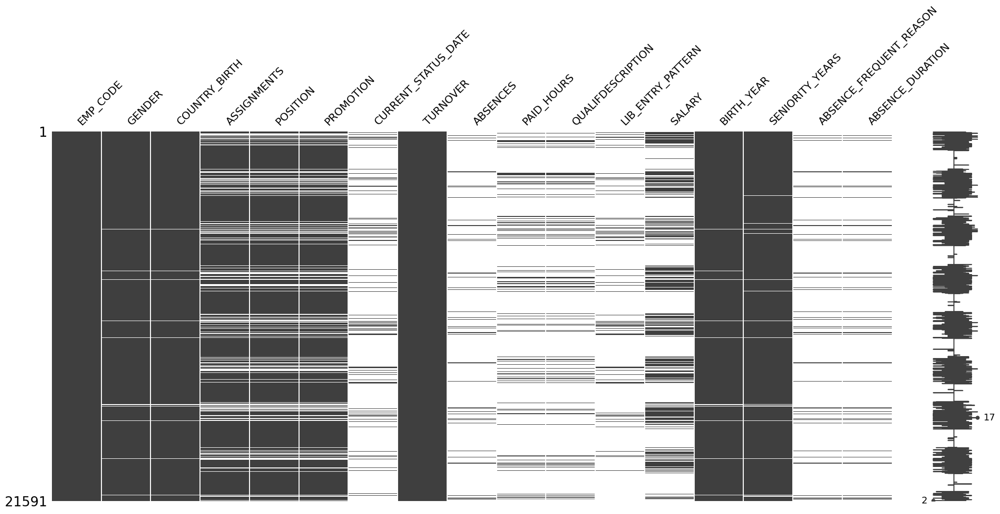

In [76]:
msno.matrix(turnover)

We have a general missing pattern  
We have a lot of missing salary data! and we can notice that this is correlated to the missingness of paid hours and qualifdescription  
let's investigate further for the missingness mechanisms!  

<Axes: >

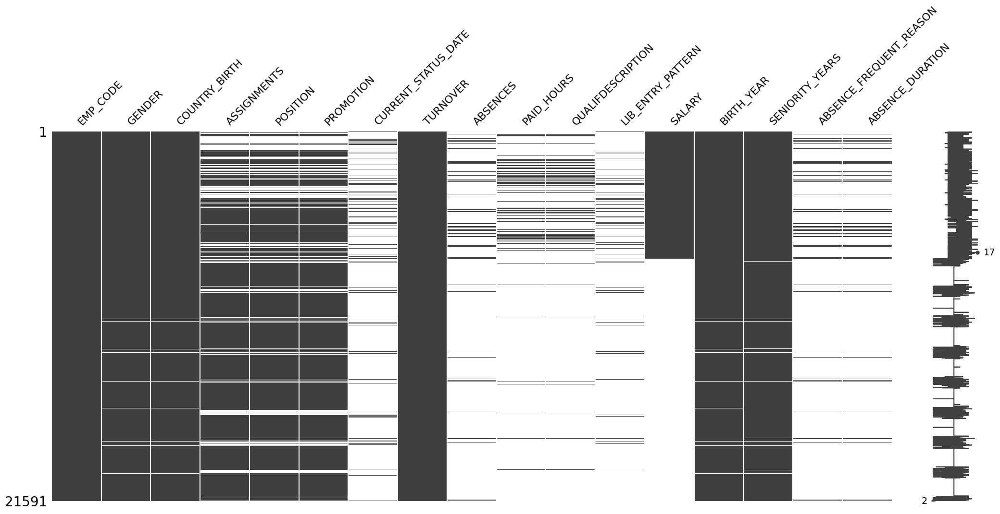

In [77]:
turnover.reset_index(drop=True, inplace=True)
turnover_sorted = turnover.sort_values(by='SALARY')
msno.matrix(turnover_sorted)

<Axes: >

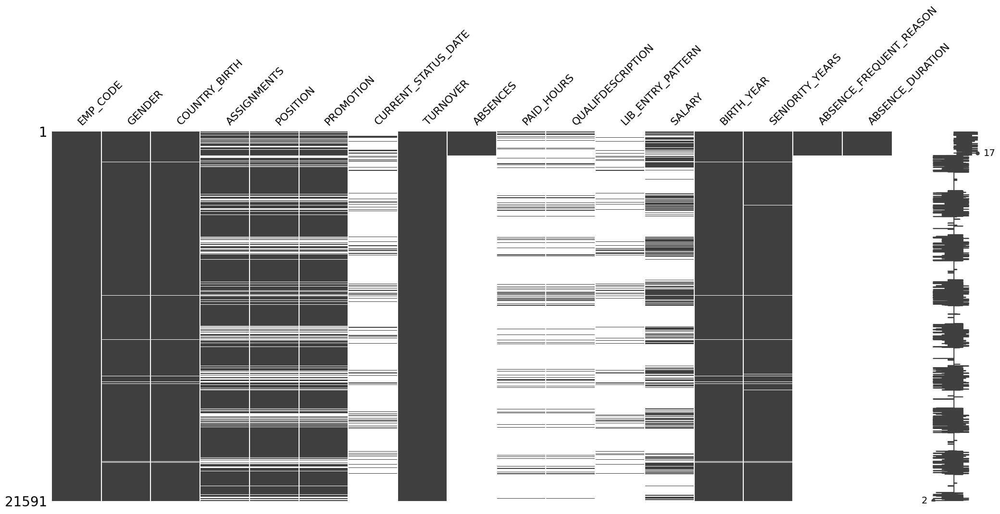

In [78]:
turnover_sorted = turnover.sort_values(by='ABSENCES')
msno.matrix(turnover_sorted)

It's obvious that data related to absence are MNAR which make them very challenging to handle 

<Axes: >

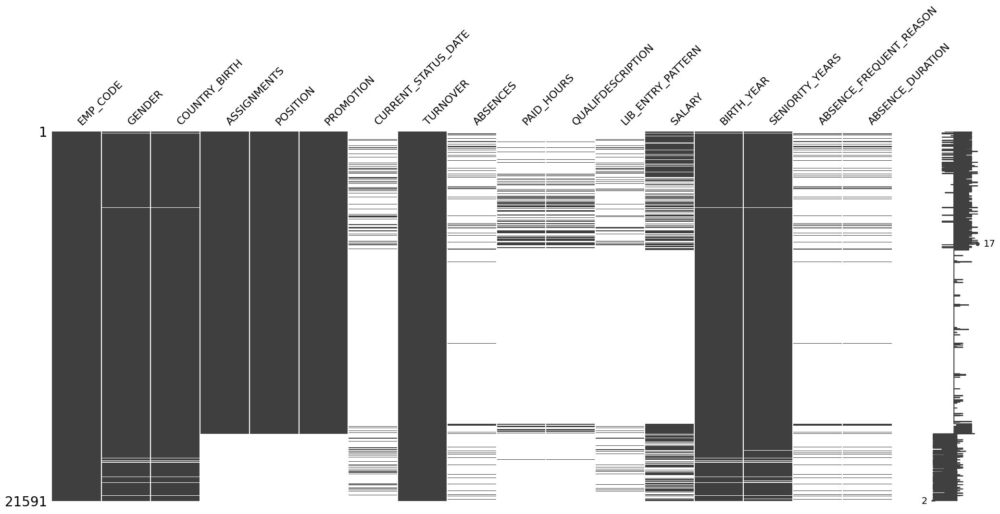

In [79]:
turnover_sorted = turnover.sort_values(by='POSITION')
msno.matrix(turnover_sorted)

We can drop the QUALIFDESCRIPTION column since it doesn't add significant value.
we can notice that position and promotion columns are MCAR

In [80]:
turnover.drop(columns=['QUALIFDESCRIPTION'],inplace=True)

Dealing with MCAR:

In [81]:
turnover.dropna(subset=['ASSIGNMENTS', 'POSITION', 'PROMOTION'], how='all', inplace=True)

In [82]:
turnover.shape

(17660, 16)

<Axes: >

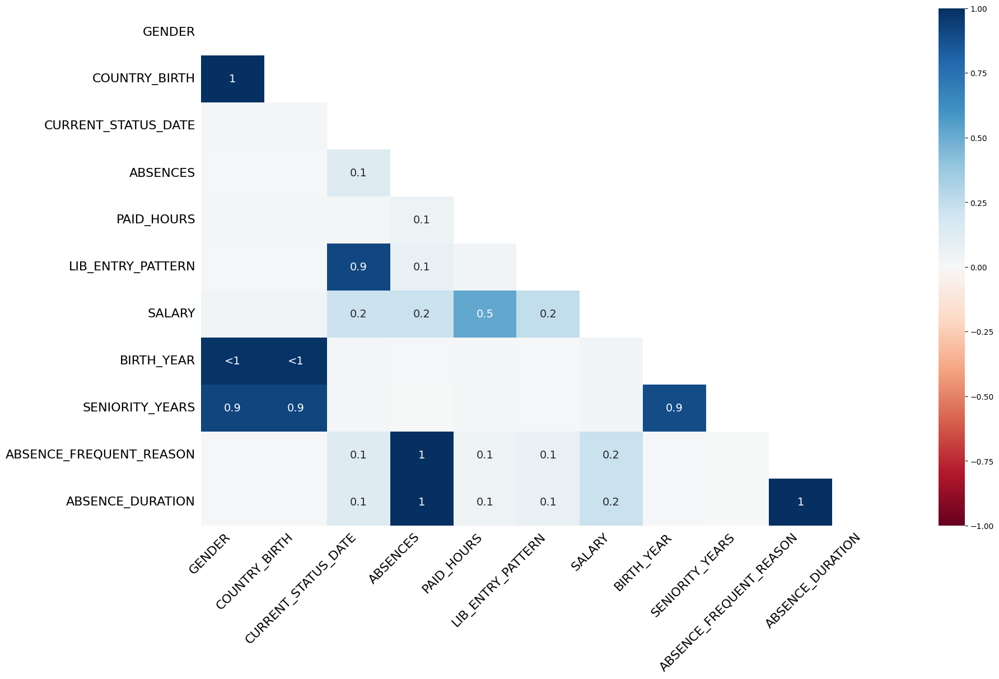

In [83]:
msno.heatmap(turnover)

H0: There is no association between the missingness in the SALARY column and the other columns. The critical  p-value associated to this test is equal to 0.05.

In [84]:
turnover['Salary_missing'] = turnover['SALARY'].isna().astype(int)

# Séparez les colonnes numériques des colonnes catégorielles
numeric_columns = turnover.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_columns = turnover.select_dtypes(include=['object', 'category']).columns.tolist()

print(numeric_columns)
print(categorical_columns)

['ASSIGNMENTS', 'ABSENCES', 'PAID_HOURS', 'SALARY', 'BIRTH_YEAR', 'SENIORITY_YEARS', 'ABSENCE_DURATION']
['EMP_CODE', 'GENDER', 'COUNTRY_BIRTH', 'POSITION', 'PROMOTION', 'TURNOVER', 'LIB_ENTRY_PATTERN', 'ABSENCE_FREQUENT_REASON']


In [85]:
for numeric_column in numeric_columns:
    f_statistic, p_value = f_oneway(turnover[turnover['Salary_missing'] == 1][numeric_column],
                                    turnover[turnover['Salary_missing'] == 0][numeric_column])
    
    print(f"One-way ANOVA between 'Salary' missing and non-missing values for '{numeric_column}':")
    print(f"F-Statistic: {f_statistic}")
    print(f"P-Value: {p_value}")
    
    alpha = 0.05
    if p_value < alpha:
        print("Reject the null hypothesis: There is a significant difference in means.")
    print("\n")

# Perform chi-squared tests for each categorical column
for categorical_column in categorical_columns:
    contingency_table = pd.crosstab(turnover['Salary_missing'], turnover[categorical_column])
    
    chi2, p_value, _, _ = chi2_contingency(contingency_table)
    
    print(f"Chi-squared test between 'Salary' missing and non-missing values for '{categorical_column}':")
    print(f"Chi-squared statistic: {chi2}")
    print(f"P-Value: {p_value}")
    
    alpha = 0.05
    if p_value < alpha:
        print(f"Reject the null hypothesis: There is an association between missingness in 'Salary' and '{categorical_column}'.")
    print("\n")

One-way ANOVA between 'Salary' missing and non-missing values for 'ASSIGNMENTS':
F-Statistic: 589.7993558532688
P-Value: 3.4843261957541545e-128
Reject the null hypothesis: There is a significant difference in means.


One-way ANOVA between 'Salary' missing and non-missing values for 'ABSENCES':
F-Statistic: nan
P-Value: nan


One-way ANOVA between 'Salary' missing and non-missing values for 'PAID_HOURS':
F-Statistic: nan
P-Value: nan


One-way ANOVA between 'Salary' missing and non-missing values for 'SALARY':
F-Statistic: nan
P-Value: nan


One-way ANOVA between 'Salary' missing and non-missing values for 'BIRTH_YEAR':
F-Statistic: nan
P-Value: nan


One-way ANOVA between 'Salary' missing and non-missing values for 'SENIORITY_YEARS':
F-Statistic: nan
P-Value: nan


One-way ANOVA between 'Salary' missing and non-missing values for 'ABSENCE_DURATION':
F-Statistic: nan
P-Value: nan


Chi-squared test between 'Salary' missing and non-missing values for 'EMP_CODE':
Chi-squared statistic: 

the missingness in 'SALARY' is associated with 'ASSIGNMENTS', 'SENIORITY_YEARS', 'GENDER', 'COUNTRY_BIRTH', 'POSITION', 'PROMOTION' and 'ABSENCE_FREQUENT_REASON' so we can conclude that the missingness of SALARY is MAR 

Deal with MAR

In [87]:
from fancyimpute import IterativeImputer

encode_col=['COUNTRY_BIRTH','GENDER','POSITION','PROMOTION','ABSENCE_FREQUENT_REASON']
encoded = pd.get_dummies(turnover[encode_col], columns=encode_col, prefix=encode_col)

selected_columns = ['ASSIGNMENTS', 'SENIORITY_YEARS', 'SALARY']
for col in selected_columns:
    encoded[col]=turnover[col]

# Appliquez MICE pour imputer les valeurs manquantes
imputer = IterativeImputer()
df_imputed = imputer.fit_transform(encoded)

# Remplacez les valeurs imputées dans la colonne 'SALARY'
turnover['SALARY'] = df_imputed[:, -1]  # La dernière colonne correspond à 'SALARY'

# Vérifiez le nombre de valeurs manquantes dans 'SALARY' après l'imputation
print(turnover['SALARY'].isna().sum())

(CVXPY) Sep 29 04:48:15 PM: Encountered unexpected exception importing solver OSQP:
ImportError('DLL load failed while importing qdldl: Le module spécifié est introuvable.')
0


In [88]:
turnover['SALARY'].isna().sum()

0

In [89]:
filtered_df = turnover[turnover['ABSENCES'] == 0]
filtered_df

,EMP_CODE,GENDER,COUNTRY_BIRTH,ASSIGNMENTS,POSITION,PROMOTION,CURRENT_STATUS_DATE,TURNOVER,ABSENCES,PAID_HOURS,LIB_ENTRY_PATTERN,SALARY,BIRTH_YEAR,SENIORITY_YEARS,ABSENCE_FREQUENT_REASON,ABSENCE_DURATION,Salary_missing


In [90]:
turnover['ABSENCES'].describe()

count    1141.000000
mean        5.899211
std         8.447953
min         1.000000
25%         1.000000
50%         3.000000
75%         6.000000
max        94.000000
Name: ABSENCES, dtype: float64

In [91]:
turnover['Absence_missing'] = turnover['ABSENCES'].isna().astype(int)

# Séparez les colonnes numériques des colonnes catégorielles
numeric_columns = turnover.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_columns = turnover.select_dtypes(include=['object', 'category']).columns.tolist()

print(numeric_columns)
print(categorical_columns)

['ASSIGNMENTS', 'ABSENCES', 'PAID_HOURS', 'SALARY', 'BIRTH_YEAR', 'SENIORITY_YEARS', 'ABSENCE_DURATION']
['EMP_CODE', 'GENDER', 'COUNTRY_BIRTH', 'POSITION', 'PROMOTION', 'TURNOVER', 'LIB_ENTRY_PATTERN', 'ABSENCE_FREQUENT_REASON']


In [92]:
for numeric_column in numeric_columns:
    f_statistic, p_value = f_oneway(turnover[turnover['Absence_missing'] == 1][numeric_column],
                                    turnover[turnover['Absence_missing'] == 0][numeric_column])
    
    print(f"One-way ANOVA between 'Absence' missing and non-missing values for '{numeric_column}':")
    print(f"F-Statistic: {f_statistic}")
    print(f"P-Value: {p_value}")
    
    alpha = 0.05
    if p_value < alpha:
        print("Reject the null hypothesis: There is a significant difference in means.")
    print("\n")

# Perform chi-squared tests for each categorical column
for categorical_column in categorical_columns:
    contingency_table = pd.crosstab(turnover['Absence_missing'], turnover[categorical_column])
    
    chi2, p_value, _, _ = chi2_contingency(contingency_table)
    
    print(f"Chi-squared test between 'Absence' missing and non-missing values for '{categorical_column}':")
    print(f"Chi-squared statistic: {chi2}")
    print(f"P-Value: {p_value}")
    
    alpha = 0.05
    if p_value < alpha:
        print(f"Reject the null hypothesis: There is an association between missingness in 'Absence' and '{categorical_column}'.")
    print("\n")

One-way ANOVA between 'Absence' missing and non-missing values for 'ASSIGNMENTS':
F-Statistic: 120.05711966215779
P-Value: 7.556492545680461e-28
Reject the null hypothesis: There is a significant difference in means.


One-way ANOVA between 'Absence' missing and non-missing values for 'ABSENCES':
F-Statistic: nan
P-Value: nan


One-way ANOVA between 'Absence' missing and non-missing values for 'PAID_HOURS':
F-Statistic: nan
P-Value: nan


One-way ANOVA between 'Absence' missing and non-missing values for 'SALARY':
F-Statistic: 0.004320406276574458
P-Value: 0.9475936928604941


One-way ANOVA between 'Absence' missing and non-missing values for 'BIRTH_YEAR':
F-Statistic: nan
P-Value: nan


One-way ANOVA between 'Absence' missing and non-missing values for 'SENIORITY_YEARS':
F-Statistic: nan
P-Value: nan


One-way ANOVA between 'Absence' missing and non-missing values for 'ABSENCE_DURATION':
F-Statistic: nan
P-Value: nan


Chi-squared test between 'Absence' missing and non-missing values 

The missingness in absences has a significant relation with ASSIGNMENTS, SENIORITY_YEARS, GENDER, COUNTRY_BIRTH, POSITION, PROMOTION, LIB_ENTRY_PATTERN. But the problem is ABSENCES column is MNAR ! hence the missingness depends on the unobserved values also. We could use the Heckman sample selection model 

In [93]:
turnover.isna().sum()

EMP_CODE                       0
GENDER                        52
COUNTRY_BIRTH                 52
ASSIGNMENTS                    0
POSITION                       0
PROMOTION                      0
CURRENT_STATUS_DATE        16126
TURNOVER                       0
ABSENCES                   16519
PAID_HOURS                 15457
LIB_ENTRY_PATTERN          16362
SALARY                         0
BIRTH_YEAR                    54
SENIORITY_YEARS               53
ABSENCE_FREQUENT_REASON    16519
ABSENCE_DURATION           16519
Salary_missing                 0
Absence_missing                0
dtype: int64

In [94]:
turnover.shape

(17660, 18)

In [95]:
turnover.dropna(subset=['GENDER','COUNTRY_BIRTH','BIRTH_YEAR','SENIORITY_YEARS'],inplace=True)
turnover.shape

(17601, 18)

In [96]:
turnover.isna().sum()

EMP_CODE                       0
GENDER                         0
COUNTRY_BIRTH                  0
ASSIGNMENTS                    0
POSITION                       0
PROMOTION                      0
CURRENT_STATUS_DATE        16067
TURNOVER                       0
ABSENCES                   16462
PAID_HOURS                 15399
LIB_ENTRY_PATTERN          16304
SALARY                         0
BIRTH_YEAR                     0
SENIORITY_YEARS                0
ABSENCE_FREQUENT_REASON    16462
ABSENCE_DURATION           16462
Salary_missing                 0
Absence_missing                0
dtype: int64

In [97]:
turnover# Step 1: Create a binary variable 'MISSING_ABSENCES' to indicate missingness
turnover['MISSING_ABSENCES'] = turnover['ABSENCES'].isnull().astype(int)

# Specify the selection equation
selection_formula = 'MISSING_ABSENCES ~ ASSIGNMENTS + SENIORITY_YEARS + POSITION + PROMOTION'

selection_model = sm.Logit.from_formula(selection_formula, data=turnover)
selection_results = selection_model.fit()

# Step 2: Calculate the inverse Mills ratio

# Calculate the IMR for each observation
turnover['IMR'] = selection_results.predict()

# Step 3: Estimate the main equation

# Specify the main equation
main_formula = 'ABSENCES ~ ASSIGNMENTS + SENIORITY_YEARS + POSITION + PROMOTION + IMR'

main_model = sm.OLS.from_formula(main_formula, data=turnover)
main_results = main_model.fit()

# Step 4: Impute missing values in 'ABSENCES' using the predicted values
turnover.loc[turnover['ABSENCES'].isnull(), 'ABSENCES'] = main_results.predict(turnover)

# The 'ABSENCES' column now contains imputed values for the missing data.

# You can access the imputed values and other statistics from the main results if needed:
imputed_values = turnover[turnover['MISSING_ABSENCES'] == 1]['ABSENCES']

         Current function value: 0.181610
         Iterations: 35


In [98]:
turnover.isna().sum()

EMP_CODE                       0
GENDER                         0
COUNTRY_BIRTH                  0
ASSIGNMENTS                    0
POSITION                       0
PROMOTION                      0
CURRENT_STATUS_DATE        16067
TURNOVER                       0
ABSENCES                       0
PAID_HOURS                 15399
LIB_ENTRY_PATTERN          16304
SALARY                         0
BIRTH_YEAR                     0
SENIORITY_YEARS                0
ABSENCE_FREQUENT_REASON    16462
ABSENCE_DURATION           16462
Salary_missing                 0
Absence_missing                0
MISSING_ABSENCES               0
IMR                            0
dtype: int64

In [99]:
turnover.drop(columns=['CURRENT_STATUS_DATE','PAID_HOURS','LIB_ENTRY_PATTERN','ABSENCE_FREQUENT_REASON','ABSENCE_DURATION','Salary_missing','Absence_missing','MISSING_ABSENCES','IMR'],inplace=True)

In [100]:
turnover.head()

,EMP_CODE,GENDER,COUNTRY_BIRTH,ASSIGNMENTS,POSITION,PROMOTION,TURNOVER,ABSENCES,SALARY,BIRTH_YEAR,SENIORITY_YEARS
5,513,M,,1.0,Directeurs,No,0.0,8.425893,2.000000e+05,1970.0,8.747945
6,11561,M,FRA,2.0,Analyste,Yes,0.0,4.845045,1.245287e+06,1980.0,9.747945
7,15181,M,FRA,1.0,Analyste,No,0.0,2.000000,1.245287e+06,1980.0,7.736986
8,21701,M,FRA,2.0,Analyste,Yes,1.0,4.561423,1.245287e+06,1980.0,7.663014
9,30722,M,FRA,1.0,Analyste,No,0.0,4.884797,1.245287e+06,1980.0,8.501370


In [101]:
turnover.isna().sum()

EMP_CODE           0
GENDER             0
COUNTRY_BIRTH      0
ASSIGNMENTS        0
POSITION           0
PROMOTION          0
TURNOVER           0
ABSENCES           0
SALARY             0
BIRTH_YEAR         0
SENIORITY_YEARS    0
dtype: int64

In [102]:
european_countries = [
    'ALB', 'AND', 'AUT', 'BLR', 'BEL', 'BIH', 'BGR', 'HRV', 'CYP', 'CZE', 
    'DNK', 'EST', 'FIN', 'FRA', 'DEU', 'GRC', 'HUN', 'ISL', 'IRL', 'ITA', 
    'KAZ', 'KOS', 'LVA', 'LIE', 'LTU', 'LUX', 'MLT', 'MDA', 'MCO', 'MNE', 
    'NLD', 'MKD', 'NOR', 'POL', 'PRT', 'ROU', 'RUS', 'SMR', 'SRB', 'SVK', 
    'SVN', 'ESP', 'SWE', 'CHE', 'TUR', 'UKR', 'GBR', 'VAT'
]

north_african_countries = ['DZA', 'EGY', 'LBY', 'MAR', 'SDN', 'TUN']

south_african_countries = ['BWA', 'LSO', 'NAM', 'ZAF', 'SWZ']

rest_of_africa_countries = [
    'AGO', 'BEN', 'BFA', 'BDI', 'CPV', 'CMR', 'CAF', 'TCD', 'COM', 'COD', 
    'DJI', 'GNQ', 'ERI', 'ETH', 'GAB', 'GMB', 'GHA', 'GIN', 'GNB', 'CIV', 
    'KEN', 'LBY', 'MDG', 'MWI', 'MLI', 'MRT', 'MUS', 'MAR', 'MOZ', 'NER', 
    'NGA', 'COG', 'RWA', 'STP', 'SEN', 'SYC', 'SLE', 'SOM', 'SSD', 'TGO', 
    'UGA', 'ZMB', 'ZWE'
]

north_american_countries = ['CAN','USA','MEX']

south_american_countries = ['ARG', 'BOL', 'BRA', 'CHL', 'COL', 'ECU', 'GUY', 'PRY', 'PER', 'SUR', 'URY', 'VEN']

central_american_countries = ['BLZ', 'CRI', 'SLV', 'GTM', 'HND', 'NIC', 'PAN']

east_asian_countries = ['CHN', 'HKG', 'JPN', 'MAC', 'MNG', 'PRK', 'KOR', 'TWN']

southeast_asian_countries = ['BRN', 'KHM', 'IDN', 'LAO', 'MYS', 'MMR', 'PHL', 'SGP', 'THA', 'TLS', 'VNM']

south_asian_countries = ['AFG', 'BGD', 'BTN', 'IND',  'IRN',  'MDV', 'NPL',  'PAK',  'LKA']

central_west_asian_countries = ['ARM','AZE','BHR','CYP', 'GEO', 'IRQ', 'ISR', 'JOR', 'KAZ', 'KGZ', 'LBN', 'OMN', 'QAT','SAU','SYR','TJK','TKM','ARE','UZB', 'YEM']

In [103]:
def assign_region_based_on_country_code(country_code):
    if country_code in european_countries:
        return 'Europe'
    if country_code in north_african_countries:
        return 'North Africa'
    if country_code in south_african_countries:
        return 'South Africa'
    if country_code in rest_of_africa_countries:
        return 'Central Africa'    
    if country_code in north_american_countries:
        return 'North America'    
    if country_code in south_american_countries:
        return 'South Africa'
    if country_code in central_american_countries:
        return 'Central Africa'    
    if country_code in east_asian_countries:
        return 'East Asia'
    elif country_code in southeast_asian_countries:
        return 'Southeast Asia'
    elif country_code in south_asian_countries:
        return 'South Asia'
    elif country_code in central_west_asian_countries:
        return 'Central/West Asia'
    else:
        return 'Others'

In [104]:
turnover['COUNTRY_BIRTH'].value_counts()

COUNTRY_BIRTH
CHE    10342
FRA     3820
BEL     1926
         892
LUX      130
USA      107
GBR       96
MAR       89
DEU       62
ESP       33
TUN       26
ITA       22
ARG       13
ATA        9
POL        8
ABW        4
COM        2
GLP        2
FIN        2
AUS        2
ISL        1
AND        1
PRT        1
SEN        1
ALB        1
AGO        1
DOM        1
DJI        1
ARE        1
AUT        1
ALA        1
BGR        1
AIA        1
CHL        1
CAN        0
MEX        0
PAK        0
AFG        0
ROM        0
RUS        0
SWE        0
IRL        0
UKR        0
DZA        0
Name: count, dtype: int64

In [105]:
turnover['REGION'] = turnover['COUNTRY_BIRTH'].apply(assign_region_based_on_country_code)

In [106]:
countries_for_others = turnover.loc[turnover['REGION'] == 'Others', 'COUNTRY_BIRTH']

In [107]:
countries_for_others.value_counts()

COUNTRY_BIRTH
       892
ATA      9
ABW      4
GLP      2
AUS      2
AIA      1
ALA      1
DOM      1
MEX      0
IRL      0
ISL      0
ITA      0
LUX      0
MAR      0
PRT      0
PAK      0
POL      0
FRA      0
ROM      0
RUS      0
SEN      0
SWE      0
TUN      0
UKR      0
GBR      0
DZA      0
FIN      0
ESP      0
AFG      0
AGO      0
ALB      0
AND      0
ARE      0
ARG      0
AUT      0
BEL      0
BGR      0
CAN      0
CHE      0
CHL      0
COM      0
DEU      0
DJI      0
USA      0
Name: count, dtype: int64

In [108]:
turnover['SALARY'].describe()

count    1.760100e+04
mean     1.245394e+06
std      8.378954e+06
min      2.000000e+02
25%      5.000000e+05
50%      1.245287e+06
75%      1.245287e+06
max      7.000000e+08
Name: SALARY, dtype: float64

In [109]:
turnover.shape

(17601, 12)

In [110]:
turnover['SALARY'].describe()

count    1.760100e+04
mean     1.245394e+06
std      8.378954e+06
min      2.000000e+02
25%      5.000000e+05
50%      1.245287e+06
75%      1.245287e+06
max      7.000000e+08
Name: SALARY, dtype: float64

In [111]:
turnover = turnover[(turnover['SALARY'] >= 1.000000e+05) & (turnover['SALARY'] <= 9.990000e+06)]

In [112]:
turnover.shape

(17477, 12)

In [113]:
turnover['SALARY'].describe()

count    1.747700e+04
mean     1.026751e+06
std      5.519893e+05
min      1.000000e+05
25%      5.000000e+05
50%      1.245287e+06
75%      1.245287e+06
max      9.900000e+06
Name: SALARY, dtype: float64

In [114]:
turnover.describe()

,ASSIGNMENTS,ABSENCES,SALARY,BIRTH_YEAR,SENIORITY_YEARS
count,17477.000000,17477.000000,1.747700e+04,17477.000000,17477.000000
mean,1.112834,5.825437,1.026751e+06,1974.538021,5.534130
std,0.512462,2.546340,5.519893e+05,8.746061,2.644494
min,1.000000,0.156084,1.000000e+05,1870.000000,0.158904
25%,1.000000,5.576179,5.000000e+05,1970.000000,4.745205
50%,1.000000,5.576179,1.245287e+06,1970.000000,4.745205
75%,1.000000,5.576179,1.245287e+06,1980.000000,5.745205
max,16.000000,94.000000,9.900000e+06,2020.000000,56.534247


In [115]:
turnover = turnover[turnover['BIRTH_YEAR'] > 1960]
turnover.describe()

,ASSIGNMENTS,ABSENCES,SALARY,BIRTH_YEAR,SENIORITY_YEARS
count,17127.000000,17127.000000,1.712700e+04,17127.000000,17127.000000
mean,1.103929,5.786064,1.033879e+06,1974.946342,5.463675
std,0.499036,2.473147,5.328458e+05,8.284824,2.404961
min,1.000000,0.156084,1.000000e+05,1961.000000,0.158904
25%,1.000000,5.576179,6.777000e+05,1970.000000,4.745205
50%,1.000000,5.576179,1.245287e+06,1970.000000,4.745205
75%,1.000000,5.576179,1.245287e+06,1980.000000,5.249315
max,16.000000,94.000000,9.900000e+06,2020.000000,30.846575


In [116]:
turnover.shape

(17127, 12)

In [118]:
current_year = datetime.now().year

# Create a mask to filter columns
turnover = turnover[turnover['SENIORITY_YEARS'] <= (current_year - turnover['BIRTH_YEAR'])]
turnover.describe()

,ASSIGNMENTS,ABSENCES,SALARY,BIRTH_YEAR,SENIORITY_YEARS
count,17125.000000,17125.000000,1.712500e+04,17125.000000,17125.000000
mean,1.103942,5.786396,1.033781e+06,1974.941197,5.463759
std,0.499064,2.473051,5.327567e+05,8.271609,2.405065
min,1.000000,0.156084,1.000000e+05,1961.000000,0.158904
25%,1.000000,5.576179,6.777000e+05,1970.000000,4.745205
50%,1.000000,5.576179,1.245287e+06,1970.000000,4.745205
75%,1.000000,5.576179,1.245287e+06,1980.000000,5.249315
max,16.000000,94.000000,9.900000e+06,2018.000000,30.846575


In [119]:
turnover.shape

(17125, 12)

In [120]:
turnover = turnover[turnover['ABSENCES'] >= 0]
turnover.describe()

,ASSIGNMENTS,ABSENCES,SALARY,BIRTH_YEAR,SENIORITY_YEARS
count,17125.000000,17125.000000,1.712500e+04,17125.000000,17125.000000
mean,1.103942,5.786396,1.033781e+06,1974.941197,5.463759
std,0.499064,2.473051,5.327567e+05,8.271609,2.405065
min,1.000000,0.156084,1.000000e+05,1961.000000,0.158904
25%,1.000000,5.576179,6.777000e+05,1970.000000,4.745205
50%,1.000000,5.576179,1.245287e+06,1970.000000,4.745205
75%,1.000000,5.576179,1.245287e+06,1980.000000,5.249315
max,16.000000,94.000000,9.900000e+06,2018.000000,30.846575


In [123]:
turnover.drop('COUNTRY_BIRTH',axis=1,inplace=True)
turnover.head()

,EMP_CODE,GENDER,ASSIGNMENTS,POSITION,PROMOTION,TURNOVER,ABSENCES,SALARY,BIRTH_YEAR,SENIORITY_YEARS,REGION
5,513,M,1.0,Directeurs,No,0.0,8.425893,2.000000e+05,1970.0,8.747945,Others
6,11561,M,2.0,Analyste,Yes,0.0,4.845045,1.245287e+06,1980.0,9.747945,Europe
7,15181,M,1.0,Analyste,No,0.0,2.000000,1.245287e+06,1980.0,7.736986,Europe
8,21701,M,2.0,Analyste,Yes,1.0,4.561423,1.245287e+06,1980.0,7.663014,Europe
9,30722,M,1.0,Analyste,No,0.0,4.884797,1.245287e+06,1980.0,8.501370,Europe
